In [1]:
#use wdtools_env_pip environment

import numpy as np
from math import log10, floor
from bisect import bisect_left
from scipy import stats
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as pltcolors
plt.style.use('Software/stefan.mplstyle')

import pandas as pd
pd.set_option('display.max_columns', None)
# Suppress SettingWithCopyWarnings
pd.options.mode.chained_assignment = None  # default='warn'

#for machine learning
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.models import load_model


# This notebook trains a machine learning method to reconstruct the correlation length in the simulation with dust effected added but reduced in strength by order of magnitude (effect_strength=10) (simulation=3)
- Use a deep learning approach with a convolutional neural network. CNNs are designed to automatically learn hierarchical features from raw data (usually images), so they are well suited to detect the peak/drop-off structure in the Moran's I x Z-Score curve that is useful in identifying the correlation length without me needing to do manual feature extraction. 
    - Use just the 1D Moran's I x Z-Score curve, don't include the distance array since the CNN will learn that scale from the labeled true correlation length
    - Don't cut the peak at small distances since the CNN should learn that feature doesn't necessarily drive the labeled true correlation length

# Import the simulation outputs

In [2]:
def get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type,nonzero_weight_cut=20,plot=True):
    #read back in measurements
    noise_label="".join(noise_effect_array)
    
    #sample_type='training','testing', or 'bootstrap'
    if sample_type=='training':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']
        
    if sample_type=='testing':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']

    Ws = npzfile['Ws']
    final_distances = npzfile['distances']
    moransIs = npzfile['moransIs'] 
    expectations = npzfile['expectations']
    variances = npzfile['variances']
    zscores = npzfile['zscores']
    
    mult=[]
    for i in range(len(moransIs)):
        mult.append(moransIs[i]*zscores[i])
        
    #cut to make sure have enough nonzero weights for valid results
    index = bisect_left(Ws, nonzero_weight_cut)
    
    if plot:
        #plot
        fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(6,15),sharex=True)
        ax1.plot(final_distances,moransIs)
        ax1.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax1.axvline(corr_length,color='green',label='True Correlation\nLength')
        ax1.axhline(expectations[0],color='red',label='No Correlation')
        ax1.set_ylabel("Moran's I")
        ax1.legend()

        ax2.plot(final_distances,zscores)
        ax2.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax2.axvline(corr_length,color='green')
        ax2.set_ylabel('Z-score')

        ax3.plot(final_distances,mult)
        ax3.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax3.axvline(corr_length,color='green')
        ax3.set_xlabel('Distance Cut')
        ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

        plt.subplots_adjust(wspace = 0,hspace=0)
        plt.show()
    
    return(final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index)


In [3]:
def count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type):
    
    #turn into combined simulation parameter array
    simulation_params=[]
    for corr_length in corr_lengths:
        for epsilon in epsilons:
            simulation_params.append([corr_length,epsilon])
            
    noise_label="".join(noise_effect_array)
    
    simulation_params_not_run=[]
    simulation_params_run=[]
    
    #check if each training data simulation has been run
    for i in range(len(simulation_params)):
        simulation=simulation_params[i]
        corr_length=simulation[0]
        epsilon=simulation[1]
        try:
            if sample_type=='training':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            if sample_type=='testing':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            simulation_params_run.append(simulation)
            #print('Simulation exists, ', simulation)
        except:
            simulation_params_not_run.append(simulation)
            #print('No simulation exists, ', simulation)

    return(simulation_params_run,simulation_params_not_run)


In [4]:
#for training data
corr_lengths=np.round(np.append(np.linspace(1,98,30)[1:],np.logspace(2,3,num=100)[1:-1]),2)
def round_sig(x,sig):
    return round(x, sig-int(floor(log10(abs(x))))-1)
epsilons_init=np.append(np.logspace(-10,-1,num=20),np.linspace(0.1,0.5,4)[1:])
epsilons=[]
for e in epsilons_init:
    epsilons.append(round_sig(e,2))

#for testing data
corr_lengths_testing=[10,25,50,75,100,150,200,250,300,400,500,600,700,800,900,1000]
epsilons_testing=[1e-10,1e-7,1e-4,0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]

In [5]:
sample_size=10207
noise_effect_array=['0','1','0','0','0']
improvement_factor=1
effect_strength=10
chance_companion=0.01
remove_likely_binaries='0'

#count how many simulations have been run

simulation_params_run,simulation_params_not_run=count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

print('training')
print(len(simulation_params_run))
print(len(simulation_params_not_run))
print('')

simulation_params_run_testing,simulation_params_not_run_testing=count_simulations(corr_lengths_testing,epsilons_testing,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'testing')
print('testing')
print(len(simulation_params_run_testing))
print(len(simulation_params_not_run_testing))

training
2921
0

testing
256
0


210.49 1.8e-06


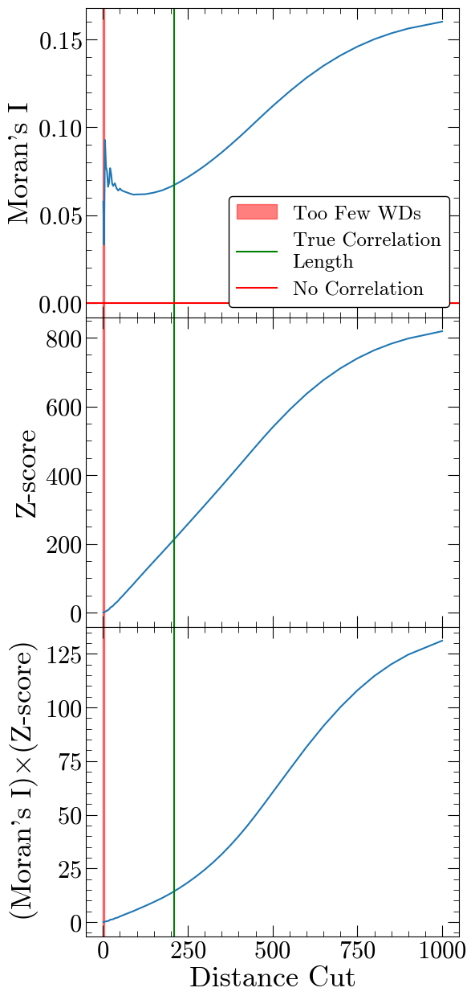

61.21 0.034


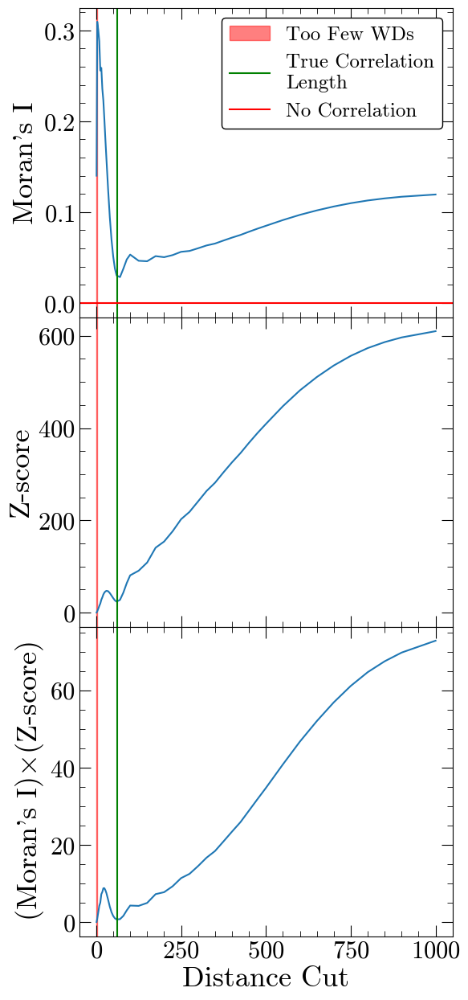

291.51 7e-08


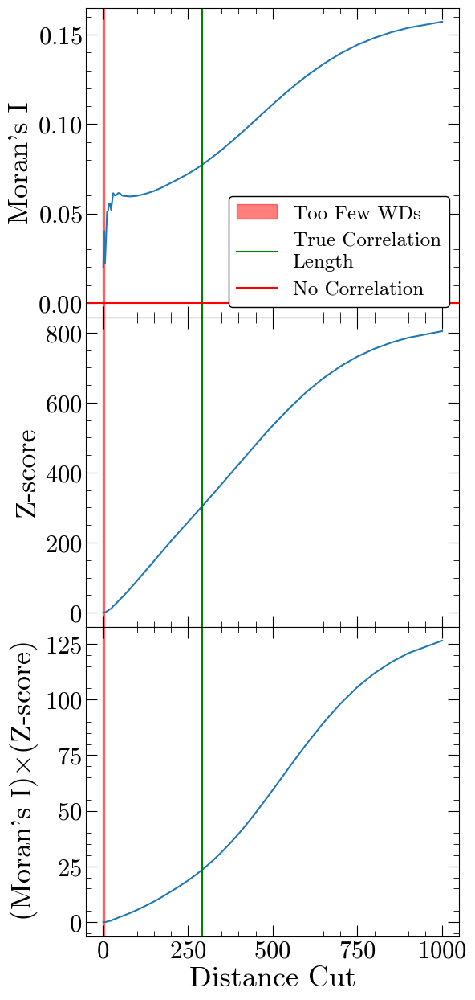

41.14 2.3e-08


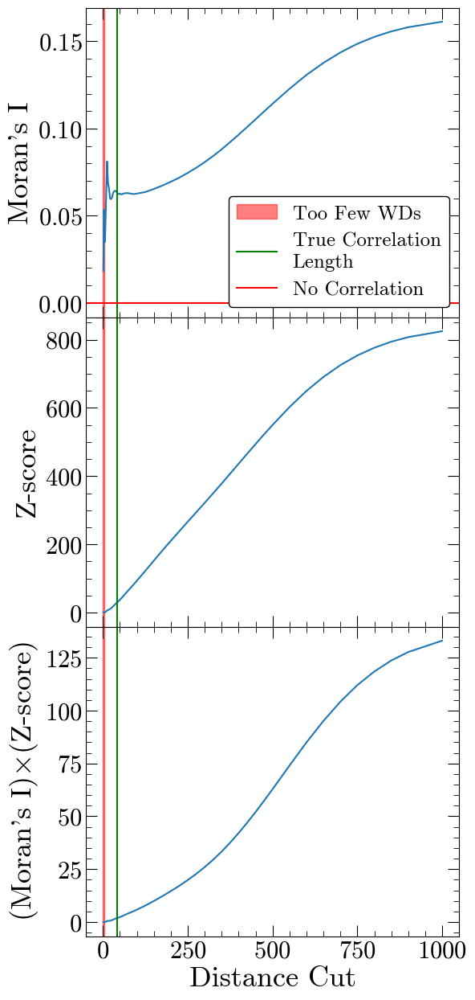

61.21 5.5e-06


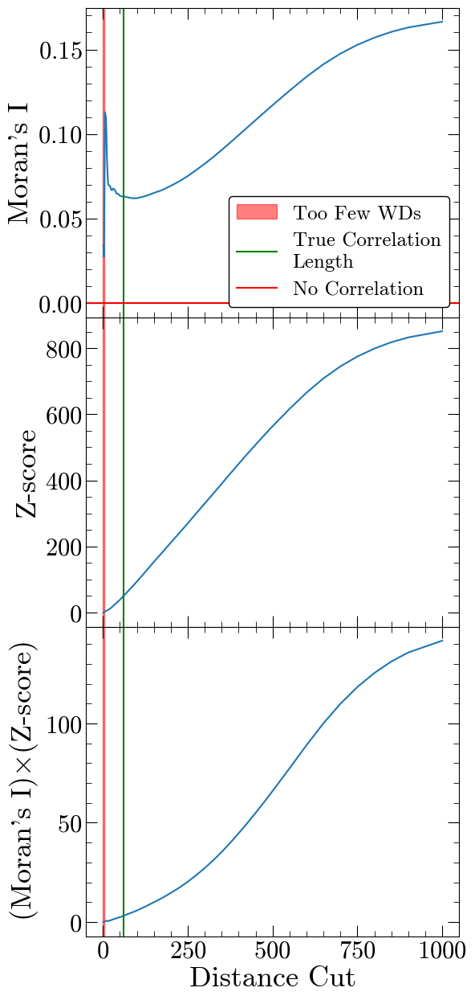

98.0 1.6e-05


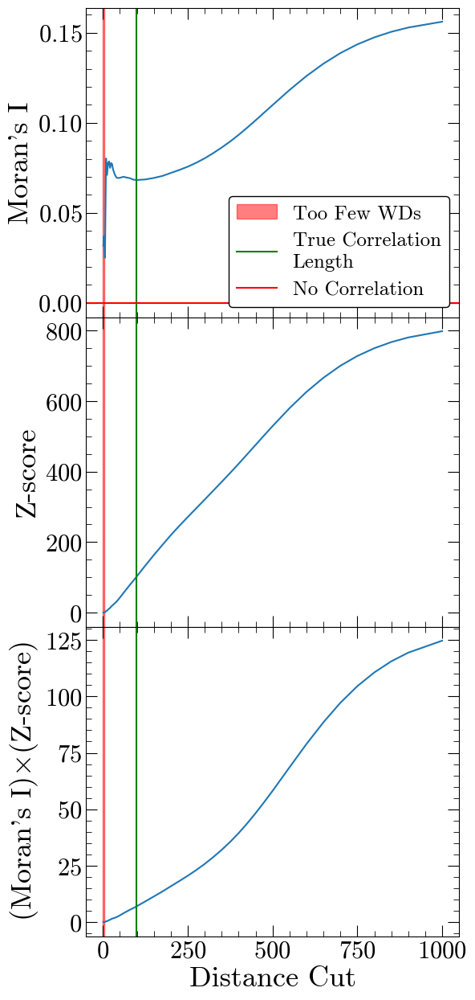

497.7 2.3e-08


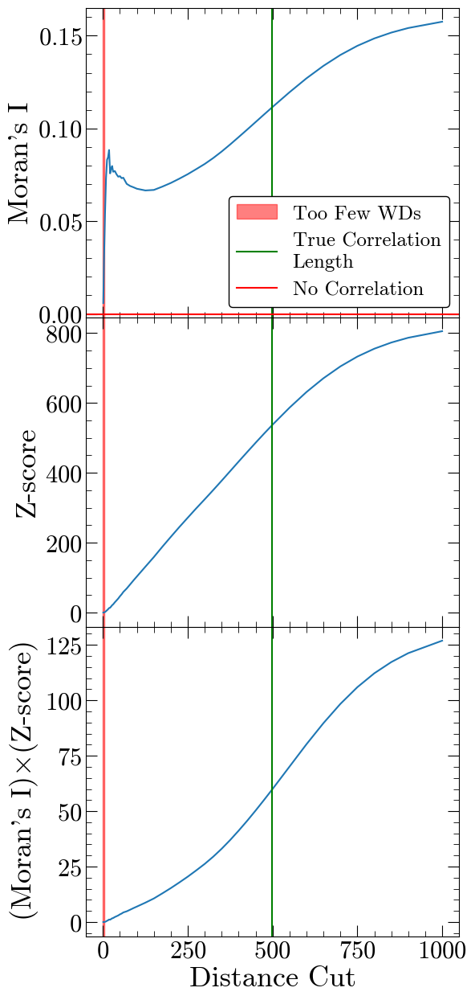

109.75 0.5


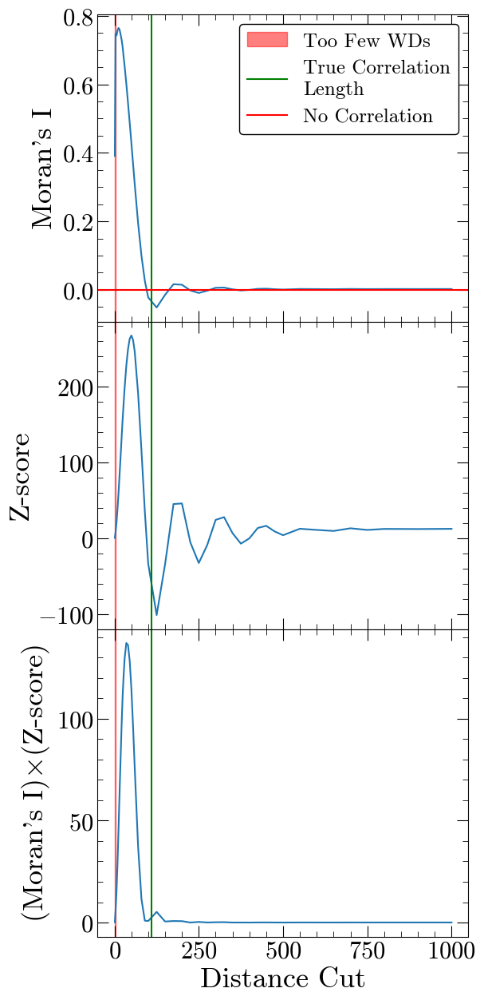

225.7 1e-10


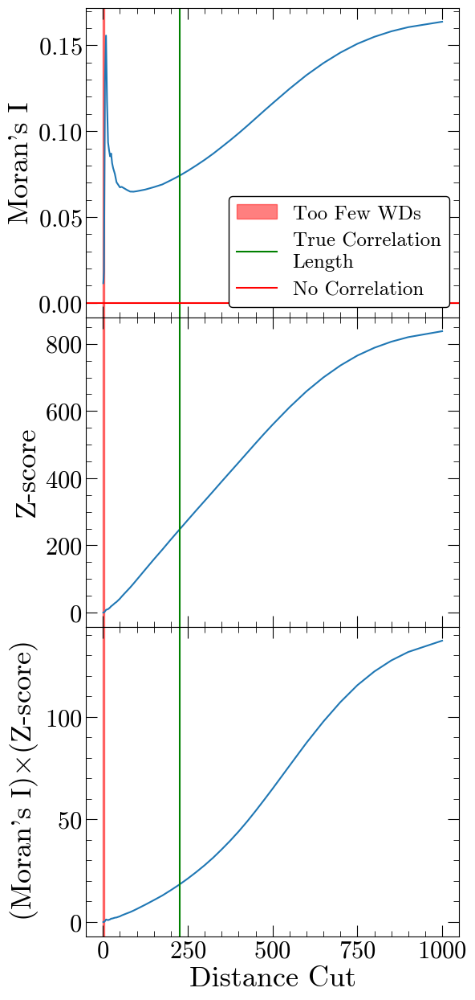

210.49 0.0013


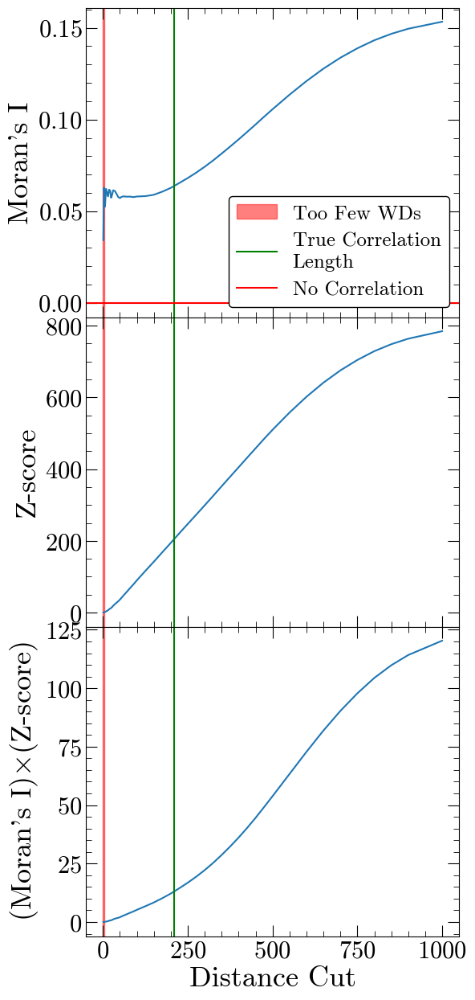

In [6]:
#display a few curves from the training data set
indices=np.random.randint(len(simulation_params_run), size=10)
for index in indices:
    corr_length=simulation_params_run[index][0]
    epsilon=simulation_params_run[index][1]
    print(corr_length,epsilon)
    sample_size=10207
    output=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

# Make a representative plot of various epsilons and correlation lengths

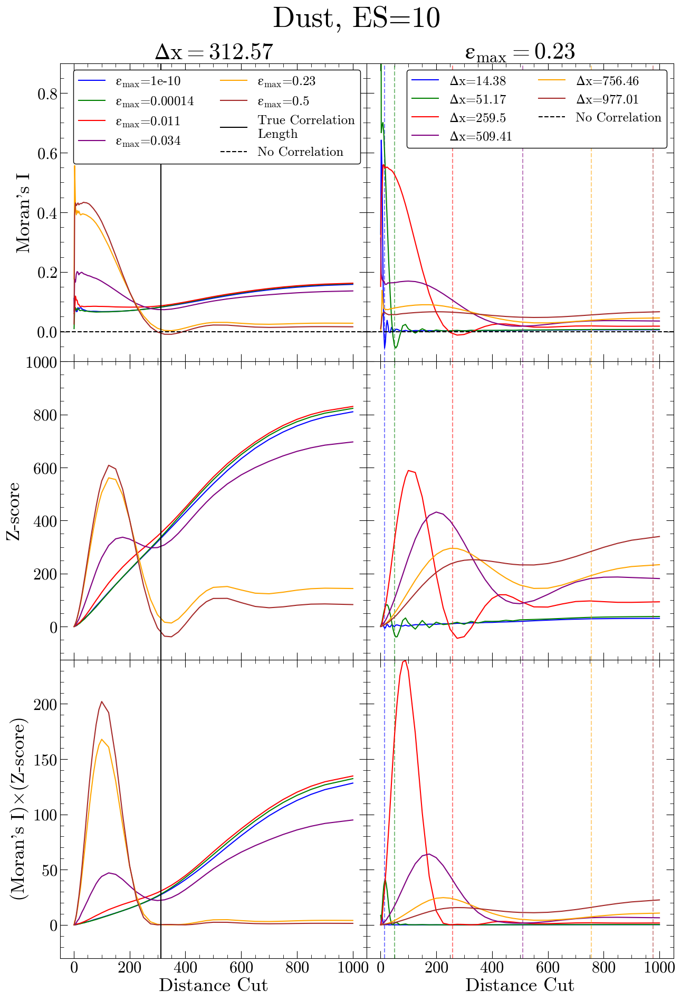

In [7]:
fig, ((ax1,ax4),(ax2,ax5),(ax3,ax6)) = plt.subplots(3,2,figsize=(15,22),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[1e-10,0.00014,0.011,0.034,0.23,0.5]#[1e-10,2.1e-07,0.00014,0.034,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon_{max}$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='upper right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    
#One epsilon length, various correlation lengths
epsilon=0.23#0.034
corr_lengths_subset=[14.38, 51.17, 259.5, 509.41, 756.46, 977.01]
for i in range(len(corr_lengths_subset)):
    corr_length=corr_lengths_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax4.plot(final_distances,moransIs,color=color,label='$\Delta x$='+str(corr_length))
    ax4.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax5.plot(final_distances,zscores,color=color)
    ax5.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax6.plot(final_distances,mult,color=color)  
    ax6.axvline(corr_length,color=color,linestyle='--',alpha=0.5)

ax4.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax4.legend(ncol=2,loc='upper right')

ax6.set_xlabel('Distance Cut')

ax4.set_title('$\epsilon_{max}=$'+str(epsilon))

#clean up the plot
ax1.set_ylim(-0.1,0.9)
ax4.set_ylim(-0.1,0.9)

ax2.set_ylim(-125,1000)
ax5.set_ylim(-125,1000)

ax3.set_ylim(-30,240)
ax6.set_ylim(-30,240)

ax4.set_yticklabels([]) 
ax5.set_yticklabels([]) 
ax6.set_yticklabels([]) 

fig.suptitle('Dust, ES=10', fontsize=40, x=0.5, y=0.93)
plt.subplots_adjust(wspace = 0,hspace=0)

plt.savefig('curves_dust_10.pdf', dpi=300)#, pad_inches=0.3)

(0.0, 80.0)

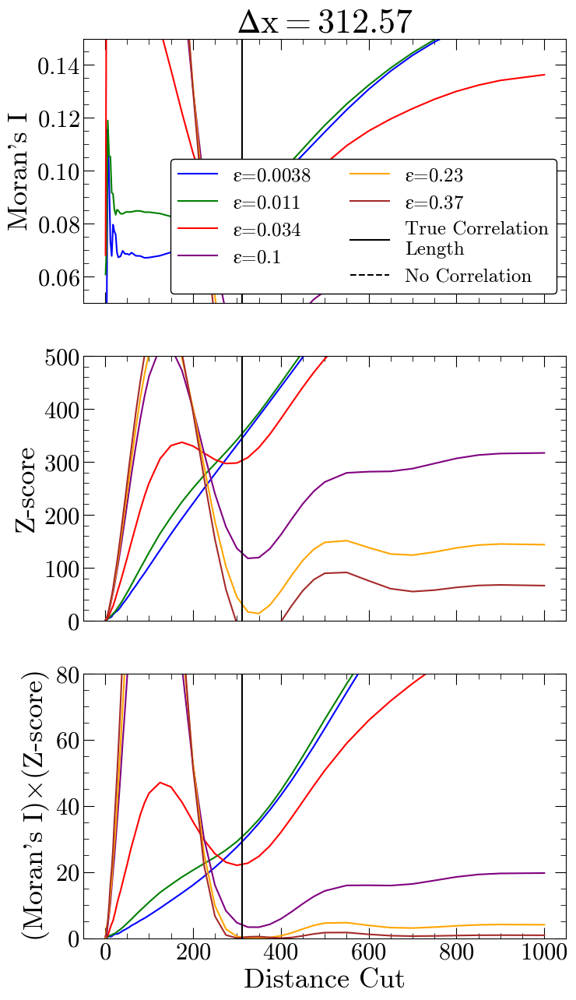

In [15]:
#find minimum visible epsilon

#min=0.011
fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(8,15),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[0.0038,0.011,0.034,0.1,0.23,0.37]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='lower right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    

#clean up the plot
ax1.set_ylim(0.05,0.15)
ax2.set_ylim(0,500)
ax3.set_ylim(0,80)


# Set up the training and testing data for the CNN

In [16]:
sample_size=10207

x_train=[]
y_train=[]
ep_train=[]
for simulation in simulation_params_run:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_train.append(normalized)
    #save correlation length as true label
    y_train.append(corr_length)
    #also save epsilon
    ep_train.append(epsilon)
    
x_train=np.array(x_train)
y_train=np.array(y_train)
ep_train=np.array(ep_train)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_train=np.nan_to_num(x_train)

#check for NaNs and Infs
print(np.isnan(x_train).any())
print(np.isinf(x_train).any())

training_data=pd.DataFrame()
training_data['y_true']=y_train
training_data['epsilon']=ep_train

training_data.head()

False
False


,y_true,epsilon
0,4.34,1.000000e-10
1,4.34,3.000000e-10
2,4.34,8.900000e-10
3,4.34,2.600000e-09
4,4.34,7.800000e-09


In [17]:
x_test=[]
y_test=[]
ep_test=[]
for simulation in simulation_params_run_testing:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'testing',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_test.append(normalized)
    #save correlation length as true label
    y_test.append(corr_length)
    #also save epsilon
    ep_test.append(epsilon)
    
x_test=np.array(x_test)
y_test=np.array(y_test)
ep_test=np.array(ep_test)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_test=np.nan_to_num(x_test)

#check for NaNs and Infs
print(np.isnan(x_test).any())
print(np.isinf(x_test).any())

testing_data=pd.DataFrame()
testing_data['y_true']=y_test
testing_data['epsilon']=ep_test

testing_data.head()

False
False


,y_true,epsilon
0,10,1.000000e-10
1,10,1.000000e-07
2,10,1.000000e-04
3,10,1.000000e-03
4,10,5.000000e-03


### Train and Test different CNN configurations

In [35]:
def comparison_stats(data,verbose,success_fit=False,success_fit_threshold=0.1):
    if success_fit:
        init_len=len(data)
        data['abs_frac_err']=np.abs((data['y_true']-data['y_pred'])/data['y_true'])
        data=data.query('abs_frac_err<@success_fit_threshold')
        num_success=len(data)
        #reset the indices
        indices=np.arange(0,len(data))
        data.set_index(indices,inplace=True)
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=num_success/init_len
    else:
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=None
    
    error=y_true-y_pred
    frac_err=error/y_true
    
    #calculate the rmse
    rmse = 0
    for i in range(len(y_true)):
        rmse += (error[i])**2
    rmse = np.sqrt(rmse / len(y_true))
    
    #calculate the median absolute error between the datasets
    mae=np.median(np.abs(error))

    #calculate the bias between the datasets
    bias=np.median(error)
    
    #calculate the median absolute fractional error
    med_frac=np.median(np.abs(frac_err))
    
    if verbose:
        if success_fit:
            print(r'Frac Success Fit: {:2.3f} '.format(frac_success))
        print(r'RMSE: {:2.3f} '.format(rmse)+'pc')
        print(r'MAE: {:2.3f} '.format(mae)+'pc')
        print(r'BIAS: {:2.3f} '.format(bias)+'pc')
        print(r'MED FRAC ERR: {:2.3f} '.format(med_frac))
        
    return(rmse,mae,bias,med_frac,error,frac_err,frac_success)

In [36]:
def comparison_plots(training_data,testing_data,success_fit_threshold=0.1,statx=10,staty=700,statdy=50,lim='default', siegel=True,verbose=True):
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    if verbose:
        print('Training Stats')
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,verbose)
    if verbose:
        print('')
        print('Training Stats, Successful Fits')
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,verbose,True,success_fit_threshold)
    if verbose:
        print('')
        print('Testing Stats')
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,verbose)
    if verbose:
        print('')
        print('Testing Stats, Successful Fits')
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,verbose,True,success_fit_threshold)
    
    stats_df=pd.DataFrame()
    stats_df['mae_training']=[mae_training]
    stats_df['frac_success_training']=[frac_success_training]
    stats_df['mae_testing']=[mae_testing]
    stats_df['frac_success_testing']=[frac_success_testing]
    
    #plot the agreement with stats
    fig, (ax1,ax2) =plt.subplots(1,2,figsize=(16,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
        
    ax2.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax2.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax2.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax2.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax2.legend()
    if lim!='default':
        ax2.set_xlim((lim[0],lim[1]))
        ax2.set_ylim((lim[0],lim[1]))
    ax2.set_yscale('log')
    ax2.set_xscale('log')
    plt.show()
    
    #plot the agreement with trendlines
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    #add a linear trendlines
    if siegel==True:
        coef = stats.siegelslopes(y_pred_testing, y_true_testing)
        poly1d_fn = np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    else:
        coef= np.polyfit(y_true_testing,y_pred_testing,1)
        poly1d_fn= np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    plt.show()

    # plot the fractional error between the datasets
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.legend()
    plt.show()
    
    # plot the fractional error between the datasets
    # again but zoomed in
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.set_ylim((-1,1))
    ax1.legend()
    plt.show()
    
    return(stats_df)
    

In [37]:
#define a function to create the heatmap
def heatmap(data, row_labels, col_labels, ax=None):
    if not ax:
        ax = plt.gca()
        
    # Define color map with custom gradients
    cmap = plt.cm.viridis  # Default, replace with any colormap of your choice
    # Define boundaries for the color ranges
    boundaries = [0, 2, 4, 6, 8, 10, 1000]
    # Define colors corresponding to each range (make sure this matches the number of ranges)
    colors_for_ranges = [
    '#228B22',  # Forest Green
    '#32CD32',  # Lime Green
    '#FFD700',  # Gold (Yellow)
    '#FFA500',  # Orange
    '#FF4500',  # Orange Red
    '#DC143C',  # Crimson
    'black']
    # Create a ListedColormap and BoundaryNorm
    cmap = pltcolors.ListedColormap(colors_for_ranges)
    norm = pltcolors.BoundaryNorm(boundaries, cmap.N)
    
    # Plot the heatmap
    im = ax.imshow(data, cmap=cmap, norm=norm)
    
    #label rows/columns
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_xticklabels(col_labels)#, fontsize=10)
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_yticklabels(row_labels)
    
    #draw grid lines
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="k", linestyle='-', linewidth=0.5,alpha=0.3)
    ax.tick_params(which="minor", bottom=False, left=False,top=False, right=False)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    return im

def heatmap_testing_data(testing_data,figtitle=None,savefig=False,figname=None):
    data=[]
    failed_fit_region_count=0
    for corr_len in corr_lengths_testing:
        tmp=[]
        for epsilon in epsilons_testing:
            val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
            tmp.append(val)
            if val>10:
                failed_fit_region_count+=1
        data.append(tmp)
    data=np.array(data)
    
    fig,ax0=plt.subplots(1, 1, figsize=(10, 10))
    ylabels=[str(i) for i in corr_lengths_testing]
    xlabels=[str(i) for i in epsilons_testing]
    hm=heatmap(data, ylabels, xlabels, ax=ax0)
    ax0.set_xlabel('$\epsilon$')
    ax0.set_ylabel('$\Delta x_{true}$')
    
    ax0.set_title(figtitle)
    
    #plot colorbar
    cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
    fig.colorbar(hm, cbar_ax)
    cbar_ax.set_ylabel("Absolute Percent Error")#,fontsize=16)
    
    if savefig:
        plt.savefig(figname+'.pdf', dpi=300)
        
    plt.show()
    print('Number of squares with abs percent err>10%, ', failed_fit_region_count)
    
    return(failed_fit_region_count)

In [51]:
def test_model(model,stats=True,plot=True):
    sample_size=10207
    
    # use the model to predict the training data
    y_pred_train = model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the testing data
    y_pred_test = model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold=0.1)
    
    if plot:
        #some runs return NaNs, show those fits
        nan_corr_lengths=testing_data[testing_data['y_pred'].isna()]
        print('')
        print('Showing the '+str(len(nan_corr_lengths))+' curves that returned NaNs')
        display(nan_corr_lengths)
        for i in range(len(nan_corr_lengths)):
            corr_length=nan_corr_lengths['y_true'].to_list()[i]
            epsilon=nan_corr_lengths['epsilon'].to_list()[i]
            output=get_output(corr_length,epsilon,sample_size,'testing',plot=True)

        #show comparison stats and plots
        stats_df=comparison_plots(training_data,testing_data)
        
        #show testing data absolute percent error heatmap
        failed_fit_region_count=heatmap_testing_data(testing_data) 
    else:
        stats_df=None
        nan_corr_lengths='Not saved!'
        failed_fit_region_count=0
        for corr_len in corr_lengths_testing:
            for epsilon in epsilons_testing:
                val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
                if val>10:
                    failed_fit_region_count+=1
    
    if stats:
        return(stats_df)
    else:
        return(failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths)

# Pick models and tune the model hyperparameters

1. **Number of Filters in Convolutional Layers**
   The number of filters (also known as the number of output channels) determines the depth of the feature maps after each convolutional layer.
   **What to try:**
   - You can experiment with **increasing** the number of filters in each layer.
   - Alternatively, **decrease** the number of filters to make the model simpler and see if performance improves.
   
   Keep in mind that increasing the number of filters typically increases the model’s capacity, which can improve performance on more complex tasks but may also lead to overfitting if not properly regularized.

2. **Kernel Size**
   The kernel size defines the window of the convolution. 
   **What to try:**
   - **Larger kernel sizes** (e.g., 5 or 7) might capture broader patterns, which can be useful if the input data has long-range dependencies.
   - **Smaller kernel sizes** (e.g., 1 or 2) might be beneficial if you want to capture very fine-grained features.

3. **Number of Layers**
   The depth of the network can have a significant impact on its performance.
   **What to try:**
   - Adding more **convolutional layers** (e.g., 4 or 5 layers instead of 3) could help the model learn more complex patterns.
   - Alternatively, you can **reduce the number of layers** and see if performance improves, especially if overfitting is a concern.

4. **Pooling Layers**
   Pooling layers help reduce spatial dimensions and retain important features. You're using `MaxPooling1D(2)` after each convolution layer, which is a good starting point.
   **What to try:**
   - **Change the pooling size** (e.g., use `MaxPooling1D(3)` or `MaxPooling1D(4)`).
   - Experiment with different **types of pooling** (e.g., **AveragePooling1D**) to see if it affects performance.

5. **Dense Layer Units**
   In your current model, the final dense layer has 128 units with ReLU activation. The number of units in this layer controls the representational capacity of the fully connected portion of the network.
   **What to try:**
   - You can experiment with **increasing** or **decreasing** the number of units (e.g., try 64 or 256 units).
   - You can also **add another dense layer** between the existing dense layer and the output to increase the model's capacity.

6. **Optimizer and Learning Rate**
   You're using the **Adam optimizer** with its default settings, which is a good default choice for most tasks. However, adjusting the learning rate can have a significant impact on performance.
   **What to try:**
   - **Adjust the learning rate** (e.g., `learning_rate=0.001`, `learning_rate=0.0005`, `learning_rate=0.0001`).
   - You could also experiment with **different optimizers** (e.g., **SGD**, **RMSprop**) to see if they improve convergence speed or final accuracy.

7. **Batch Size**
   The batch size you’re currently using is 32, which is a standard choice.
   **What to try:**
   - Experiment with **larger batch sizes** (e.g., 64 or 128) to speed up training, or **smaller batch sizes** (e.g., 16 or 8) if you believe that could help the model generalize better.
   - Smaller batch sizes can help avoid local minima, while larger batch sizes usually converge faster.

8. **Regularization (Dropout or L2 Regularization)**
   You’re not using any regularization at the moment, which may cause overfitting, especially with a deep model.
   **What to try:**
   - **Dropout**: Add `Dropout` layers after the convolutional or dense layers to help prevent overfitting. Try dropout rates between 0.2 and 0.5.
   - **L2 Regularization**: Add L2 regularization to your layers, which helps penalize large weights and reduces overfitting. Example: `kernel_regularizer=l2(0.01)`.

9. **Activation Function**
   You're using ReLU as the activation function for all layers, which is quite common.
   **What to try:**
   - Experiment with different **activation functions** for the hidden layers, such as **LeakyReLU**, **ELU**, or **SELU**.
   - For the output layer, if you're predicting a continuous variable (since you're using `mse` loss), you may want to use a **linear activation** (which is the default for `Dense(1)`).


Epoch 1/100
92/92 [==============================] - 0s 3ms/step - loss: 115286.0781
Epoch 2/100
92/92 [==============================] - 0s 3ms/step - loss: 62483.4414
Epoch 3/100
92/92 [==============================] - 0s 3ms/step - loss: 59546.0039
Epoch 4/100
92/92 [==============================] - 0s 3ms/step - loss: 58350.3086
Epoch 5/100
92/92 [==============================] - 0s 3ms/step - loss: 57705.0117
Epoch 6/100
92/92 [==============================] - 0s 3ms/step - loss: 57898.6211
Epoch 7/100
92/92 [==============================] - 0s 3ms/step - loss: 57661.8984
Epoch 8/100
92/92 [==============================] - 0s 3ms/step - loss: 57444.5664
Epoch 9/100
92/92 [==============================] - 0s 3ms/step - loss: 57207.4883
Epoch 10/100
92/92 [==============================] - 0s 3ms/step - loss: 57079.1367
Epoch 11/100
92/92 [==============================] - 0s 3ms/step - loss: 56814.5703
Epoch 12/100
92/92 [==============================] - 0s 3ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 234.133 pc
MAE: 158.066 pc
BIAS: -12.634 pc
MED FRAC ERR: 0.503 

Training Stats, Successful Fits
Frac Success Fit: 0.222 
RMSE: 17.476 pc
MAE: 9.249 pc
BIAS: 4.297 pc
MED FRAC ERR: 0.038 

Testing Stats
RMSE: 219.830 pc
MAE: 42.896 pc
BIAS: 4.476 pc
MED FRAC ERR: 0.139 

Testing Stats, Successful Fits
Frac Success Fit: 0.480 
RMSE: 26.587 pc
MAE: 9.174 pc
BIAS: 4.795 pc
MED FRAC ERR: 0.036 


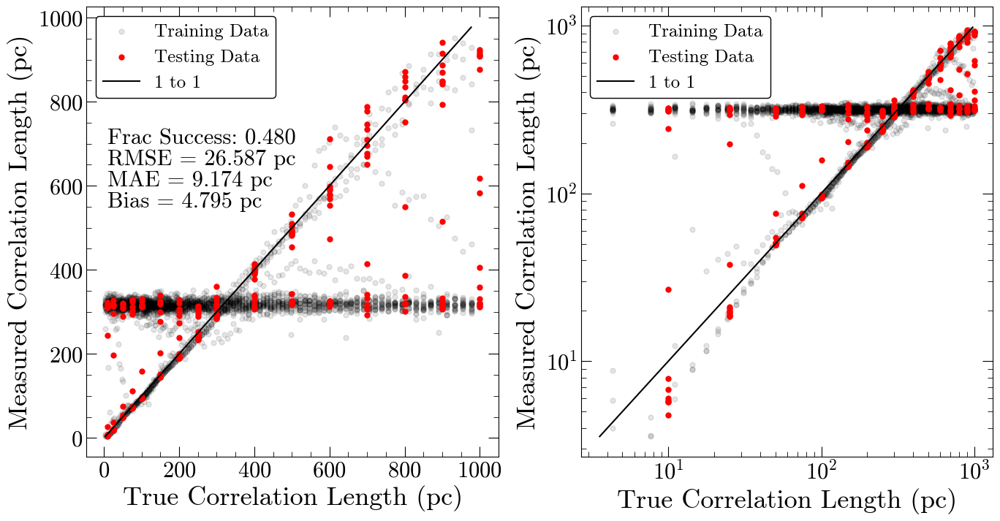

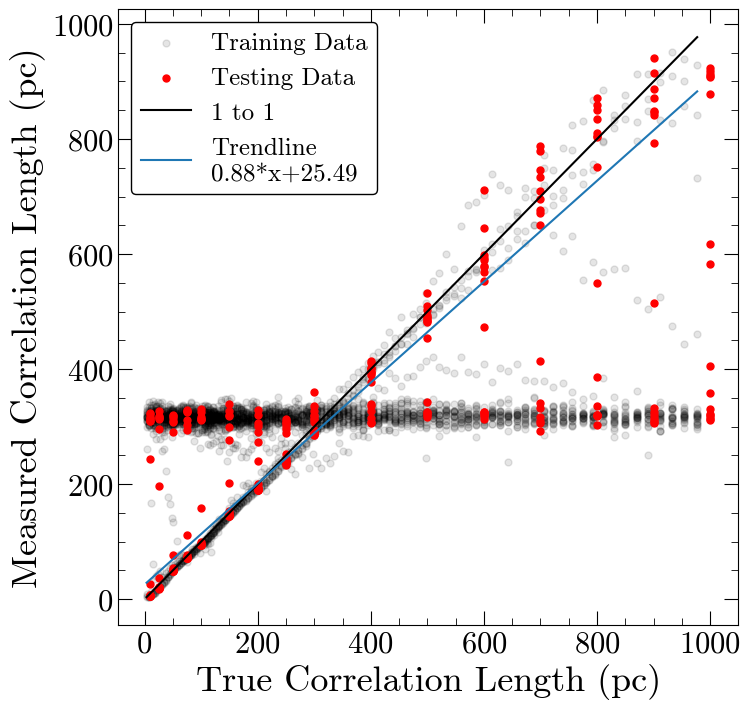

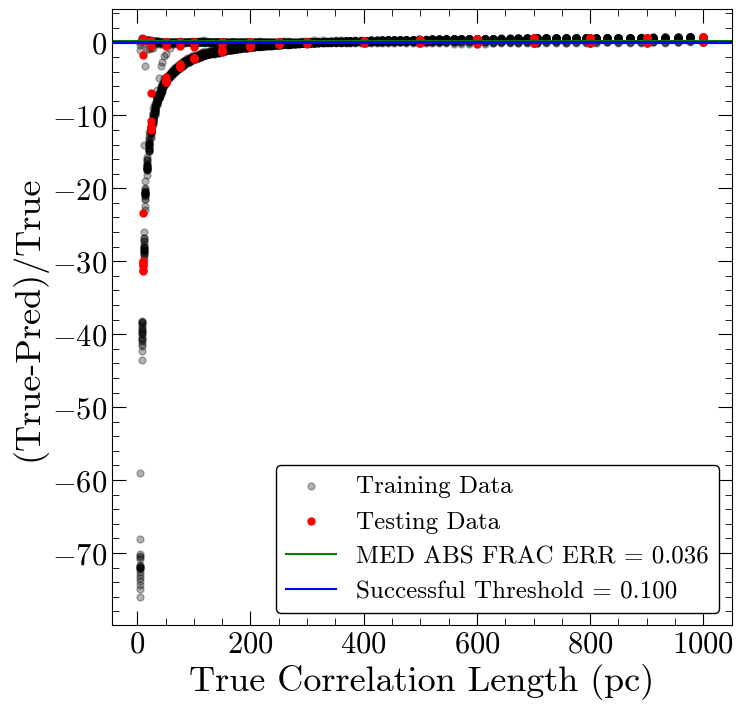

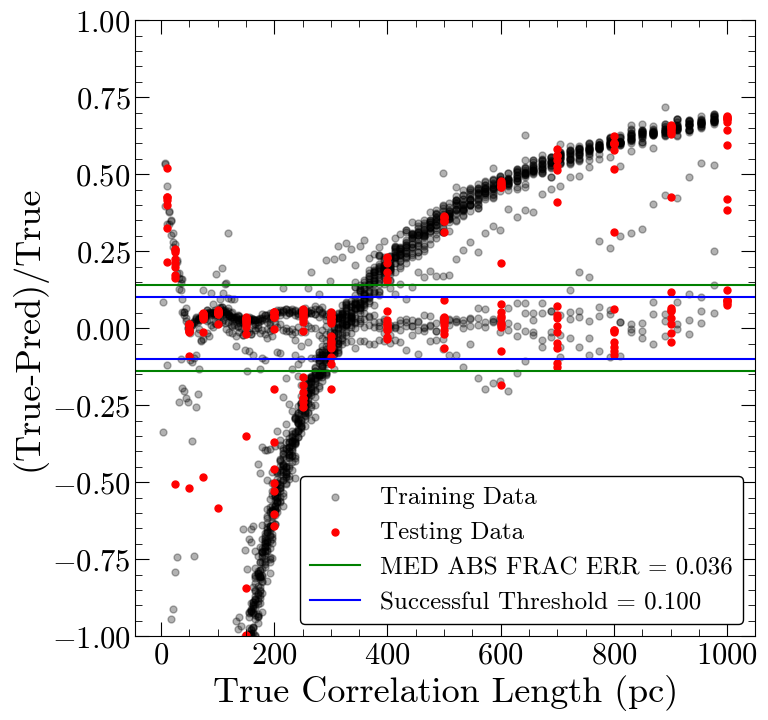

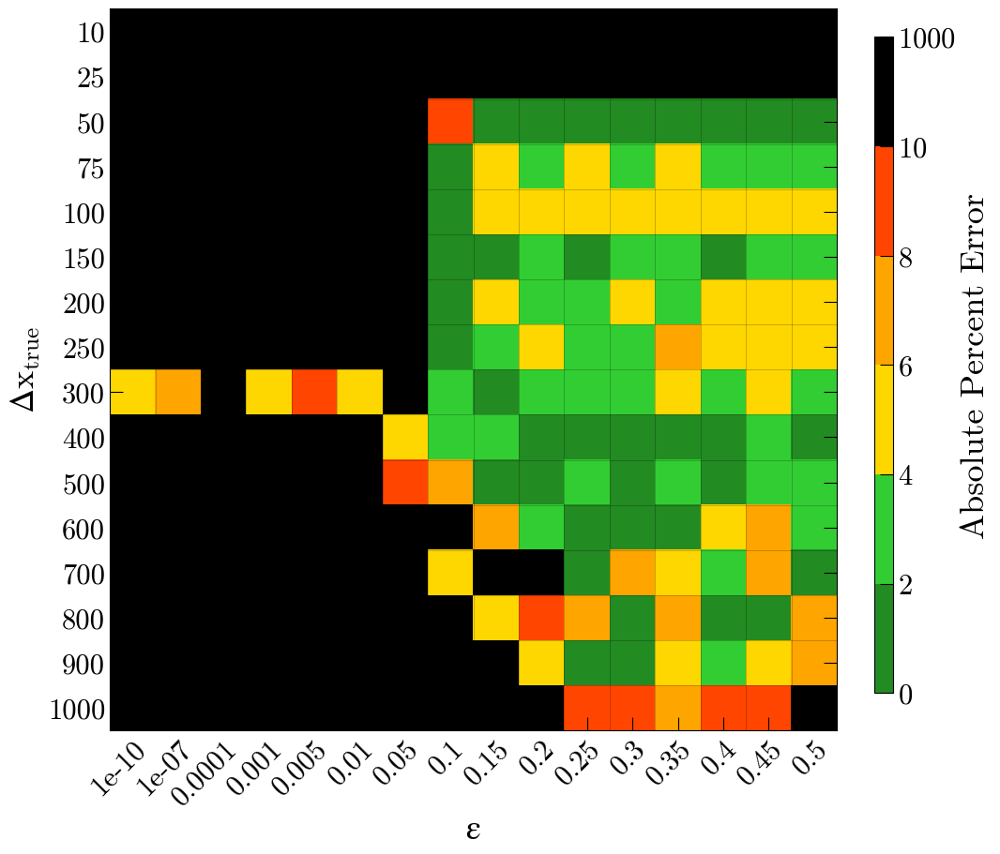

Number of squares with abs percent err>10%,  133


In [39]:
#simple model
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats for all models to compare and find best model
all_model_stats=output

Epoch 1/200
92/92 [==============================] - 1s 4ms/step - loss: 118340.4453
Epoch 2/200
92/92 [==============================] - 0s 5ms/step - loss: 62914.8594
Epoch 3/200
92/92 [==============================] - 0s 4ms/step - loss: 60447.9570
Epoch 4/200
92/92 [==============================] - 0s 4ms/step - loss: 58698.1016
Epoch 5/200
92/92 [==============================] - 0s 4ms/step - loss: 58187.2617
Epoch 6/200
92/92 [==============================] - 0s 4ms/step - loss: 57736.7383
Epoch 7/200
92/92 [==============================] - 0s 4ms/step - loss: 57745.9727
Epoch 8/200
92/92 [==============================] - 0s 5ms/step - loss: 57415.4453
Epoch 9/200
92/92 [==============================] - 0s 4ms/step - loss: 57289.1250
Epoch 10/200
92/92 [==============================] - 0s 4ms/step - loss: 57267.7891
Epoch 11/200
92/92 [==============================] - 0s 4ms/step - loss: 57134.6250
Epoch 12/200
92/92 [==============================] - 0s 5ms/step - loss:

92/92 [==============================] - 1s 6ms/step - loss: 54402.2852
Epoch 193/200
92/92 [==============================] - 1s 6ms/step - loss: 54434.3672
Epoch 194/200
92/92 [==============================] - 1s 6ms/step - loss: 54446.4922
Epoch 195/200
92/92 [==============================] - 0s 5ms/step - loss: 54392.7578
Epoch 196/200
92/92 [==============================] - 1s 6ms/step - loss: 54498.4141
Epoch 197/200
92/92 [==============================] - 1s 6ms/step - loss: 54323.6484
Epoch 198/200
92/92 [==============================] - 1s 6ms/step - loss: 54332.8828
Epoch 199/200
92/92 [==============================] - 1s 6ms/step - loss: 54385.0781
Epoch 200/200
92/92 [==============================] - 1s 8ms/step - loss: 54353.7539

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 232.673 pc
MAE: 155.757 pc
BIAS: -21.435 pc
MED FRAC ERR: 0.493 

Training Stats, Successful Fits
Frac Success Fit: 0.216 
RMSE: 19.647 pc
MAE: 10.916 pc
BIAS: -6.978 pc
MED FRAC ERR: 0.047 

Testing Stats
RMSE: 214.300 pc
MAE: 38.590 pc
BIAS: -9.824 pc
MED FRAC ERR: 0.145 

Testing Stats, Successful Fits
Frac Success Fit: 0.406 
RMSE: 26.119 pc
MAE: 12.961 pc
BIAS: -10.084 pc
MED FRAC ERR: 0.041 


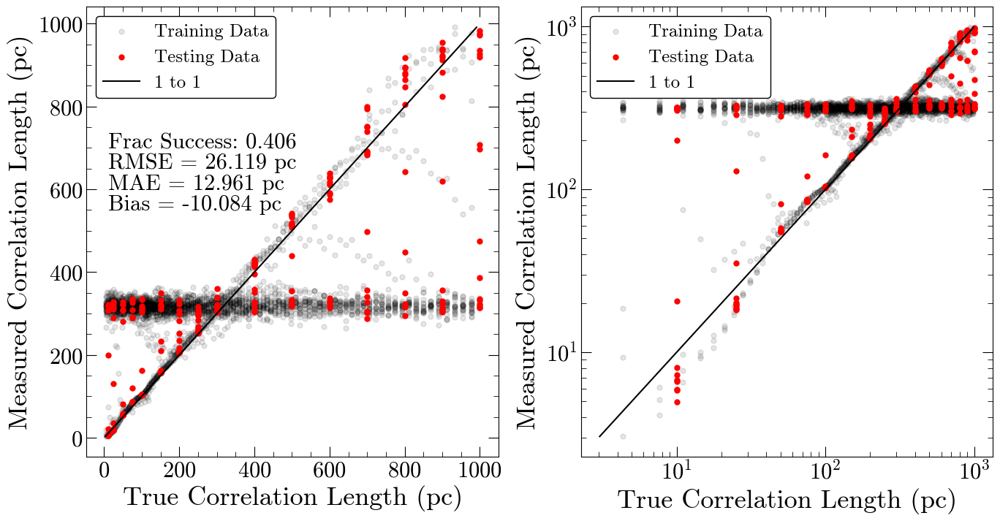

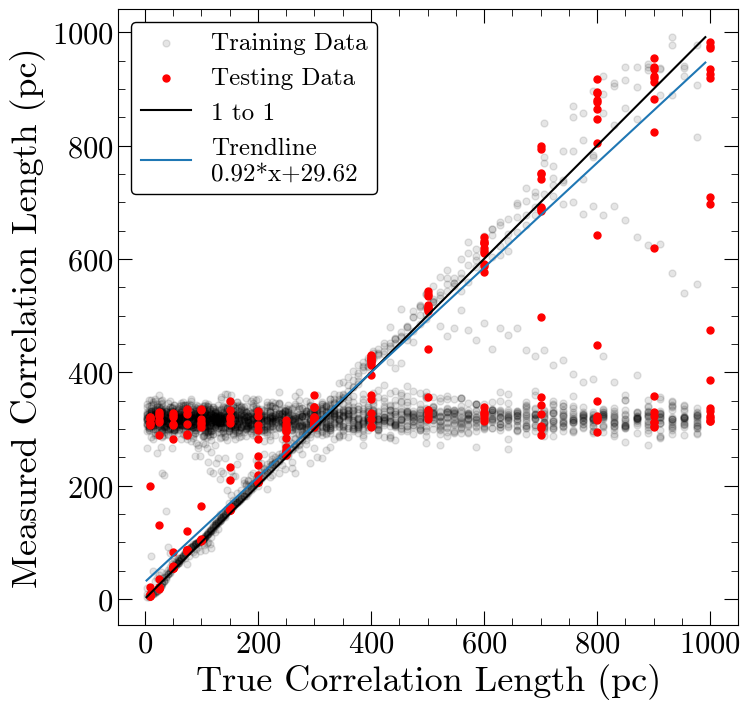

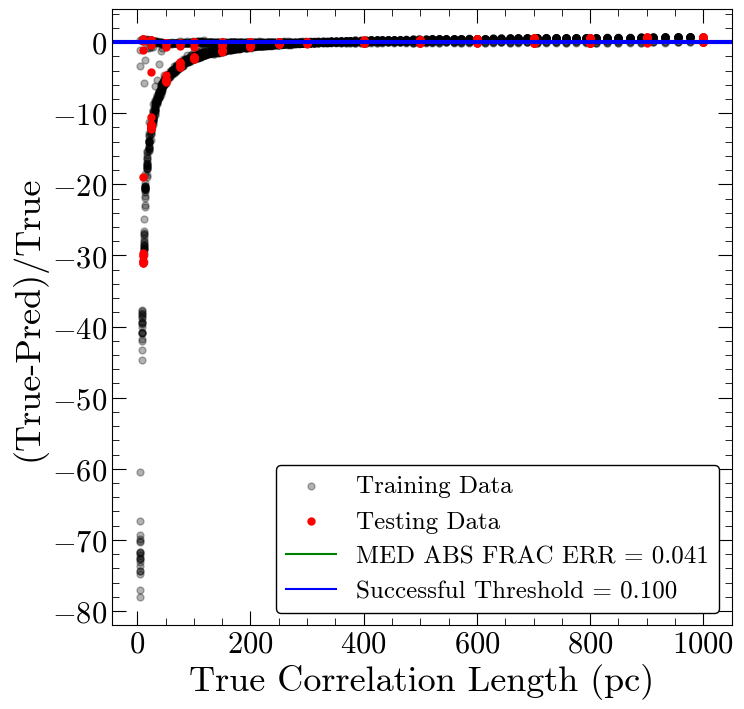

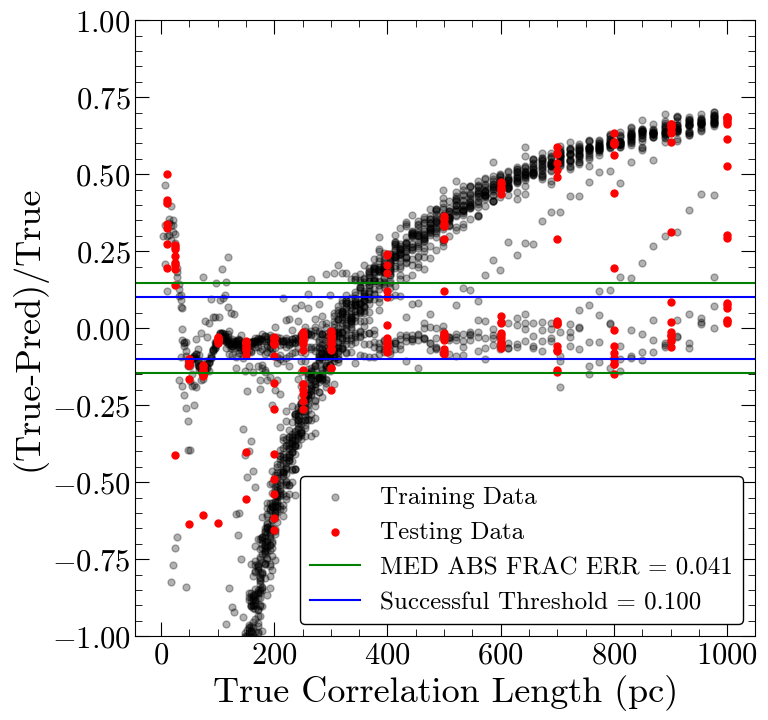

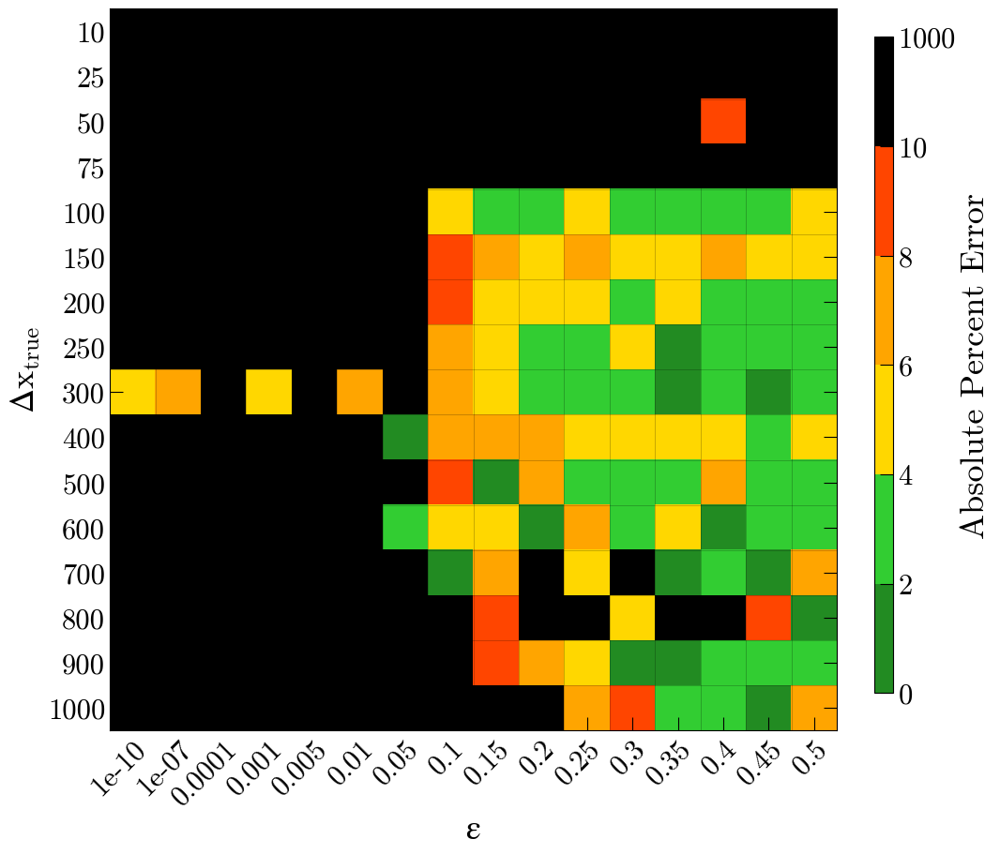

Number of squares with abs percent err>10%,  152


In [40]:
#simple model, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 11ms/step - loss: 99485.9297
Epoch 2/100
92/92 [==============================] - 1s 8ms/step - loss: 60988.9336
Epoch 3/100
92/92 [==============================] - 1s 10ms/step - loss: 59499.2930
Epoch 4/100
92/92 [==============================] - 1s 7ms/step - loss: 58223.3555
Epoch 5/100
92/92 [==============================] - 1s 7ms/step - loss: 58355.5508
Epoch 6/100
92/92 [==============================] - 1s 6ms/step - loss: 57780.3672
Epoch 7/100
92/92 [==============================] - 1s 7ms/step - loss: 57392.9141
Epoch 8/100
92/92 [==============================] - 1s 6ms/step - loss: 57442.2148
Epoch 9/100
92/92 [==============================] - 1s 6ms/step - loss: 56944.3086
Epoch 10/100
92/92 [==============================] - 1s 9ms/step - loss: 56958.5938
Epoch 11/100
92/92 [==============================] - 1s 8ms/step - loss: 56372.5039
Epoch 12/100
92/92 [==============================] - 1s 12ms/step - los

92/92 [==============================] - 1s 14ms/step - loss: 54313.4766
Epoch 98/100
92/92 [==============================] - 1s 13ms/step - loss: 54035.4883
Epoch 99/100
92/92 [==============================] - 1s 13ms/step - loss: 54020.4219
Epoch 100/100
92/92 [==============================] - 1s 10ms/step - loss: 54067.8242

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 232.460 pc
MAE: 143.982 pc
BIAS: 3.739 pc
MED FRAC ERR: 0.489 

Training Stats, Successful Fits
Frac Success Fit: 0.197 
RMSE: 21.276 pc
MAE: 12.826 pc
BIAS: 9.402 pc
MED FRAC ERR: 0.050 

Testing Stats
RMSE: 214.856 pc
MAE: 34.740 pc
BIAS: 11.048 pc
MED FRAC ERR: 0.134 

Testing Stats, Successful Fits
Frac Success Fit: 0.398 
RMSE: 24.909 pc
MAE: 13.931 pc
BIAS: 9.972 pc
MED FRAC ERR: 0.046 


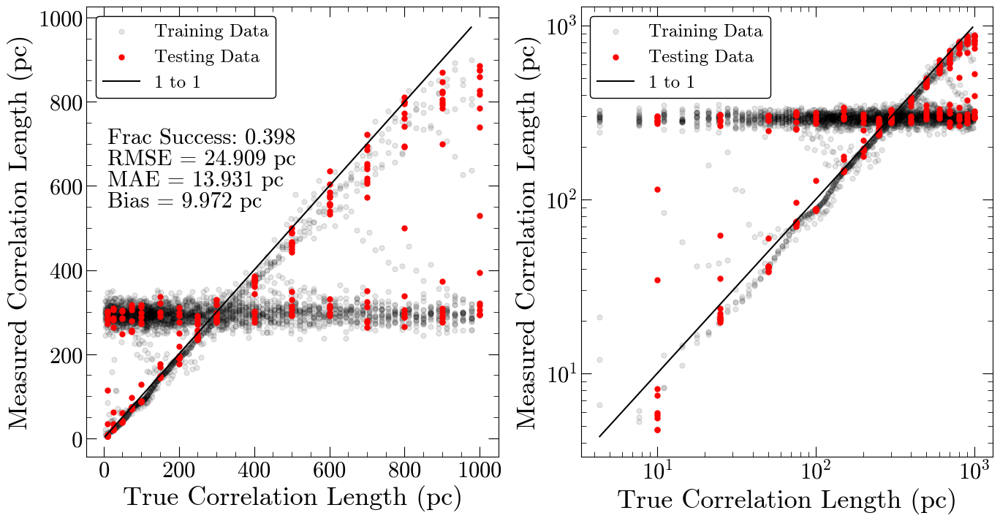

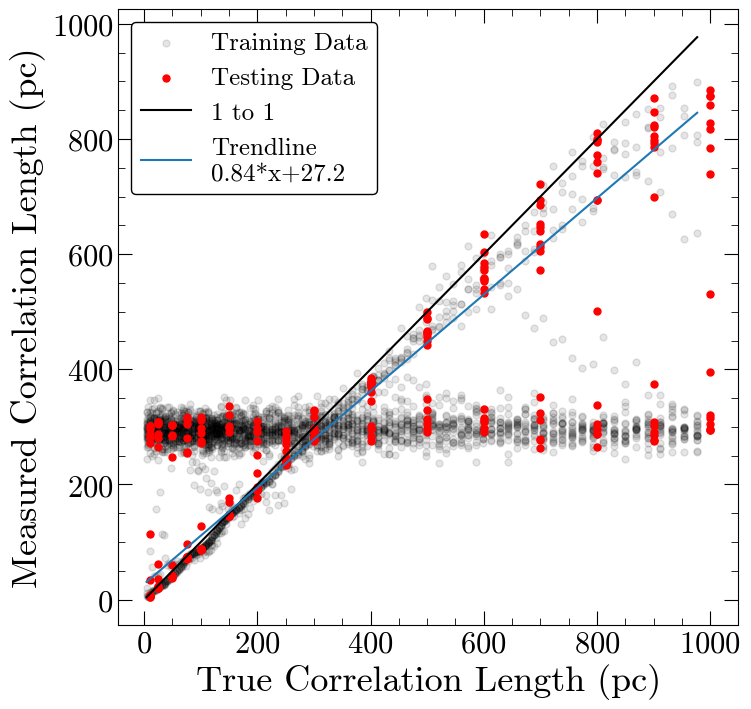

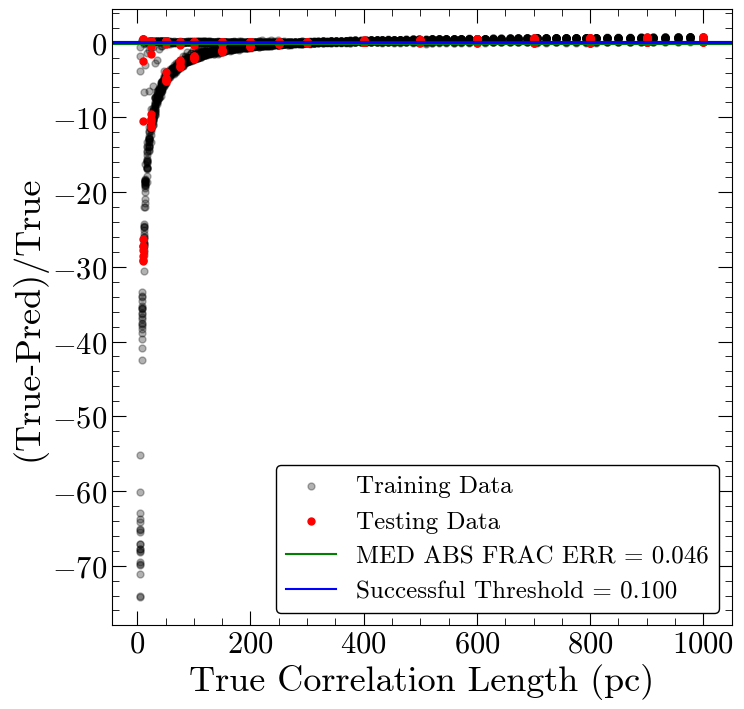

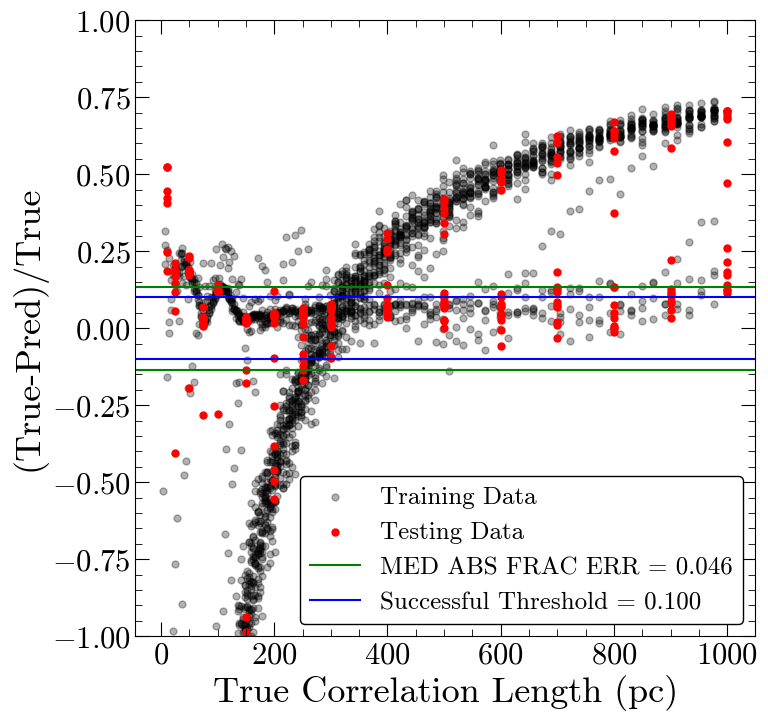

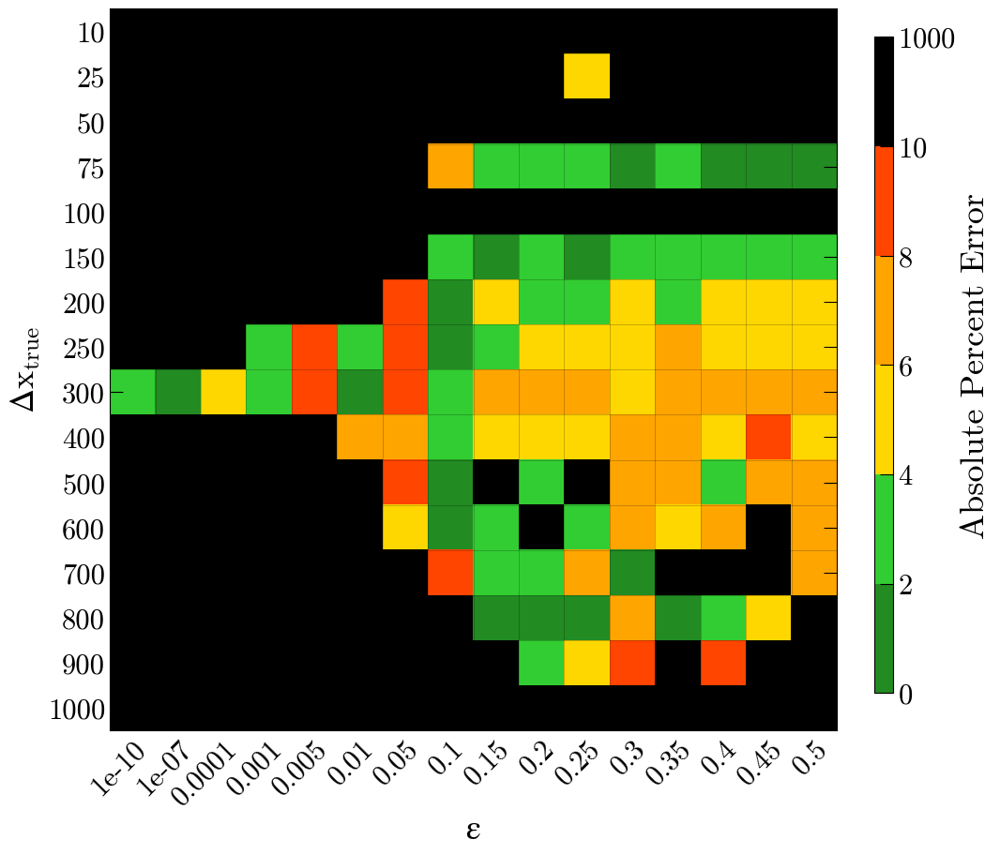

Number of squares with abs percent err>10%,  154


In [41]:
#model with more layers
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 2s 10ms/step - loss: 94603.4688
Epoch 2/200
92/92 [==============================] - 1s 8ms/step - loss: 59888.7461
Epoch 3/200
92/92 [==============================] - 1s 9ms/step - loss: 58400.5156
Epoch 4/200
92/92 [==============================] - 1s 8ms/step - loss: 57885.5742
Epoch 5/200
92/92 [==============================] - 1s 10ms/step - loss: 57348.3203
Epoch 6/200
92/92 [==============================] - 1s 8ms/step - loss: 57266.7383
Epoch 7/200
92/92 [==============================] - 1s 8ms/step - loss: 57179.2031
Epoch 8/200
92/92 [==============================] - 1s 10ms/step - loss: 56862.7578
Epoch 9/200
92/92 [==============================] - 1s 9ms/step - loss: 56606.8945
Epoch 10/200
92/92 [==============================] - 1s 9ms/step - loss: 56716.8711
Epoch 11/200
92/92 [==============================] - 1s 11ms/step - loss: 56655.8047
Epoch 12/200
92/92 [==============================] - 1s 9ms/step - lo

92/92 [==============================] - 1s 10ms/step - loss: 54229.0430
Epoch 98/200
92/92 [==============================] - 1s 10ms/step - loss: 54392.0234
Epoch 99/200
92/92 [==============================] - 1s 9ms/step - loss: 53911.1445
Epoch 100/200
92/92 [==============================] - 1s 9ms/step - loss: 54291.1719
Epoch 101/200
92/92 [==============================] - 1s 9ms/step - loss: 54109.6719
Epoch 102/200
92/92 [==============================] - 1s 12ms/step - loss: 54393.6836
Epoch 103/200
92/92 [==============================] - 1s 9ms/step - loss: 54226.3867
Epoch 104/200
92/92 [==============================] - 1s 10ms/step - loss: 54596.6289
Epoch 105/200
92/92 [==============================] - 1s 9ms/step - loss: 54149.2969
Epoch 106/200
92/92 [==============================] - 1s 9ms/step - loss: 53933.0352
Epoch 107/200
92/92 [==============================] - 1s 9ms/step - loss: 54249.6445
Epoch 108/200
92/92 [==============================] - 1s 9ms/step

92/92 [==============================] - 1s 8ms/step - loss: 53412.2305
Epoch 193/200
92/92 [==============================] - 1s 10ms/step - loss: 53239.7617
Epoch 194/200
92/92 [==============================] - 1s 9ms/step - loss: 53413.6641
Epoch 195/200
92/92 [==============================] - 1s 8ms/step - loss: 53736.1328
Epoch 196/200
92/92 [==============================] - 1s 8ms/step - loss: 53685.4727
Epoch 197/200
92/92 [==============================] - 1s 8ms/step - loss: 53288.3086
Epoch 198/200
92/92 [==============================] - 1s 12ms/step - loss: 53672.9492
Epoch 199/200
92/92 [==============================] - 1s 11ms/step - loss: 53357.2930
Epoch 200/200
92/92 [==============================] - 1s 9ms/step - loss: 53251.7461

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 230.063 pc
MAE: 147.798 pc
BIAS: -20.855 pc
MED FRAC ERR: 0.486 

Training Stats, Successful Fits
Frac Success Fit: 0.211 
RMSE: 21.047 pc
MAE: 13.015 pc
BIAS: -9.005 pc
MED FRAC ERR: 0.052 

Testing Stats
RMSE: 206.620 pc
MAE: 32.771 pc
BIAS: -11.632 pc
MED FRAC ERR: 0.105 

Testing Stats, Successful Fits
Frac Success Fit: 0.484 
RMSE: 27.162 pc
MAE: 13.938 pc
BIAS: -9.737 pc
MED FRAC ERR: 0.053 


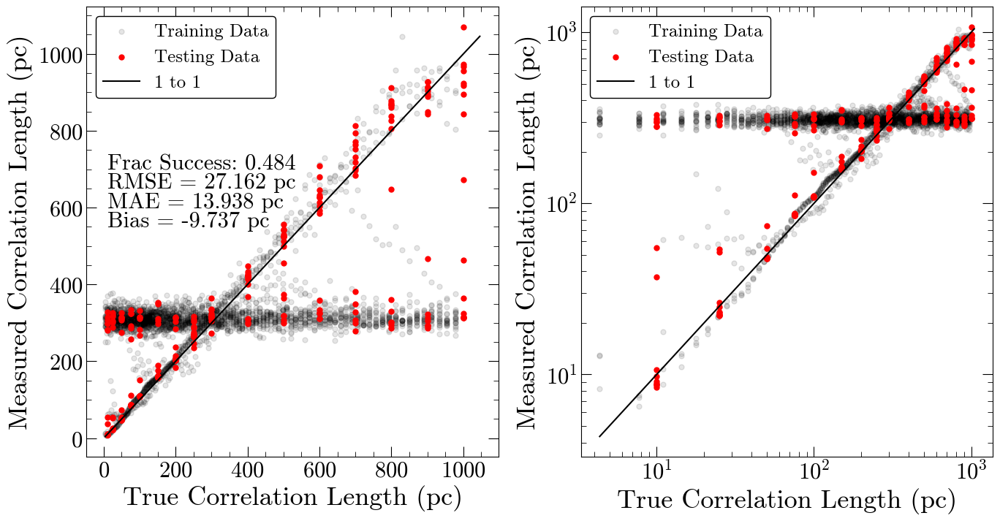

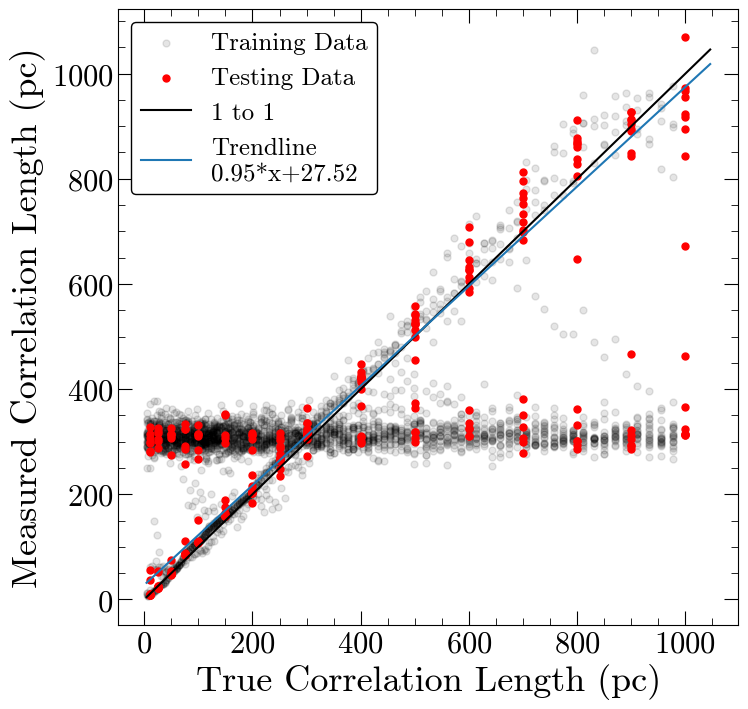

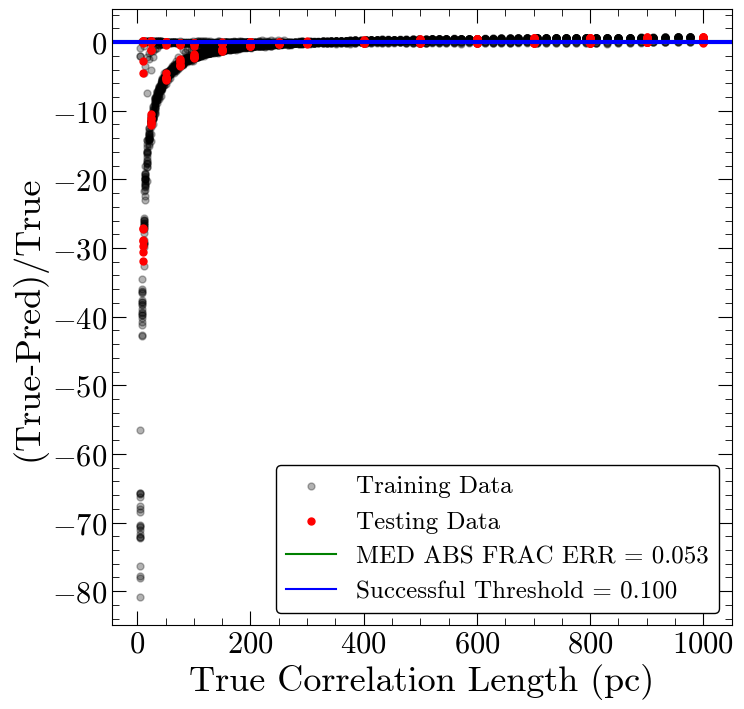

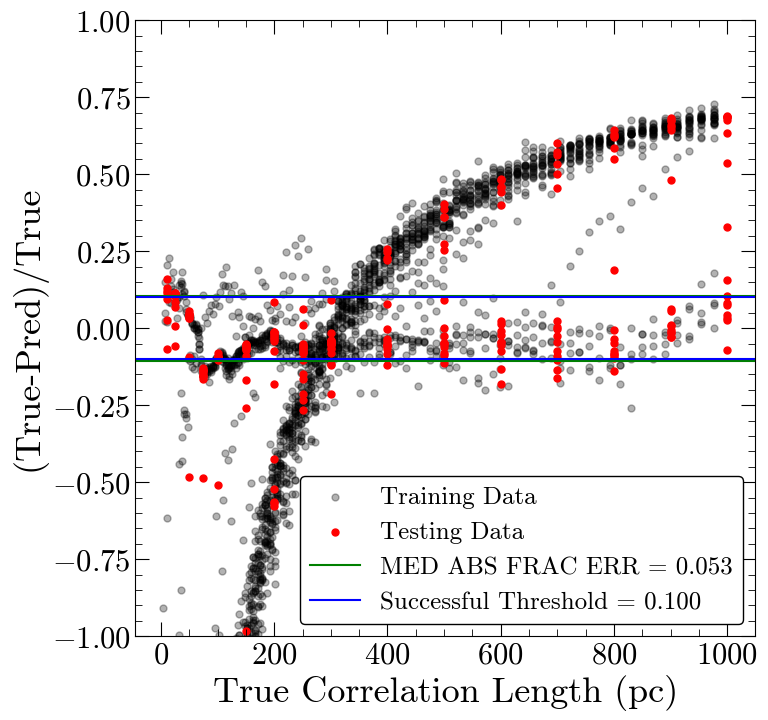

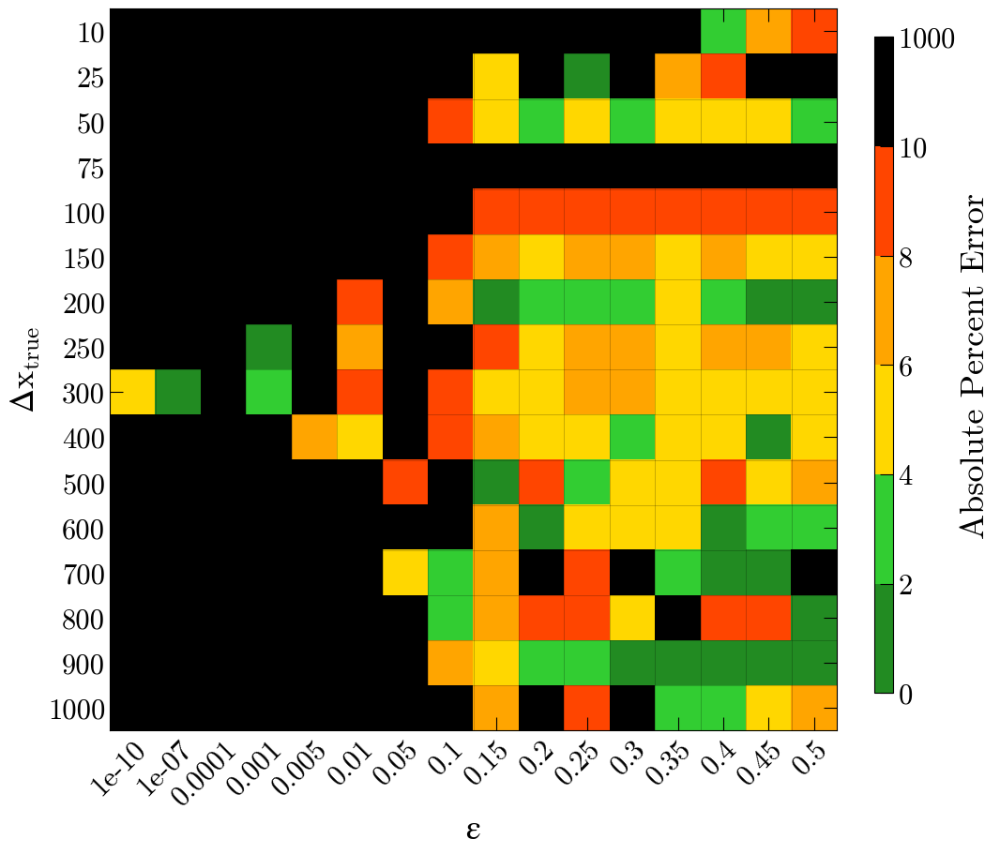

Number of squares with abs percent err>10%,  132


In [42]:
#model with more layers, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 2s 11ms/step - loss: 109757.5156
Epoch 2/100
92/92 [==============================] - 1s 8ms/step - loss: 62152.1602
Epoch 3/100
92/92 [==============================] - 1s 9ms/step - loss: 59805.4688
Epoch 4/100
92/92 [==============================] - 1s 8ms/step - loss: 58911.6914
Epoch 5/100
92/92 [==============================] - 1s 8ms/step - loss: 58263.2148
Epoch 6/100
92/92 [==============================] - 1s 8ms/step - loss: 57933.3320
Epoch 7/100
92/92 [==============================] - 1s 9ms/step - loss: 58150.6953
Epoch 8/100
92/92 [==============================] - 1s 7ms/step - loss: 57330.7539
Epoch 9/100
92/92 [==============================] - 1s 9ms/step - loss: 57280.3125
Epoch 10/100
92/92 [==============================] - 1s 10ms/step - loss: 57534.2617
Epoch 11/100
92/92 [==============================] - 1s 10ms/step - loss: 56981.0781
Epoch 12/100
92/92 [==============================] - 1s 11ms/step - l

92/92 [==============================] - 1s 9ms/step - loss: 54164.3945
Epoch 98/100
92/92 [==============================] - 1s 10ms/step - loss: 53800.1250
Epoch 99/100
92/92 [==============================] - 1s 9ms/step - loss: 53577.4062
Epoch 100/100
92/92 [==============================] - 1s 8ms/step - loss: 54538.9766

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 232.730 pc
MAE: 144.475 pc
BIAS: -2.489 pc
MED FRAC ERR: 0.498 

Training Stats, Successful Fits
Frac Success Fit: 0.208 
RMSE: 18.378 pc
MAE: 7.423 pc
BIAS: 2.757 pc
MED FRAC ERR: 0.029 

Testing Stats
RMSE: 214.358 pc
MAE: 31.965 pc
BIAS: 5.745 pc
MED FRAC ERR: 0.138 

Testing Stats, Successful Fits
Frac Success Fit: 0.414 
RMSE: 25.436 pc
MAE: 5.975 pc
BIAS: 4.648 pc
MED FRAC ERR: 0.023 


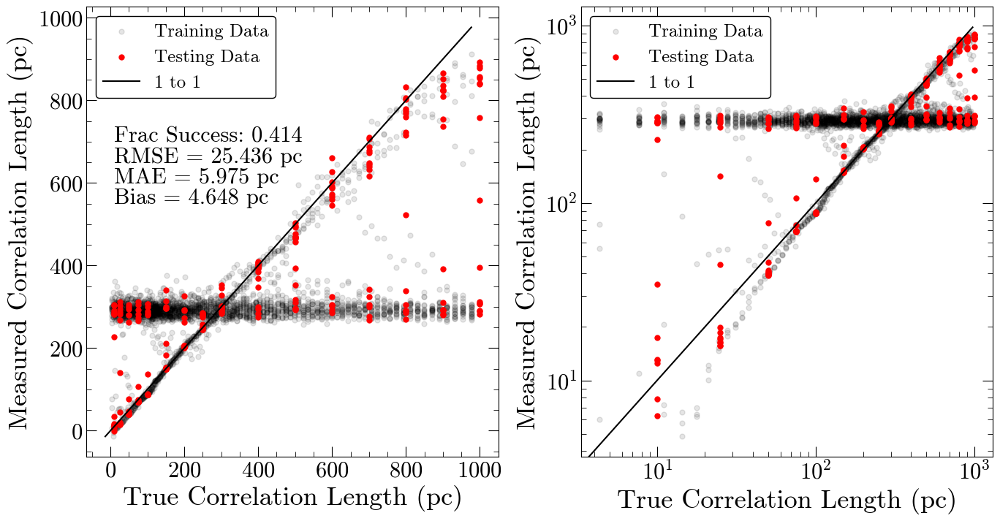

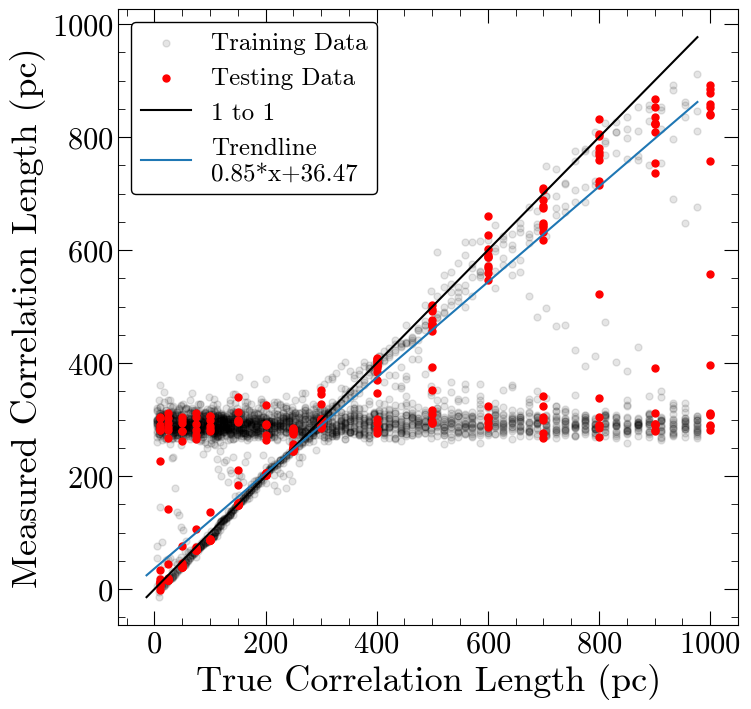

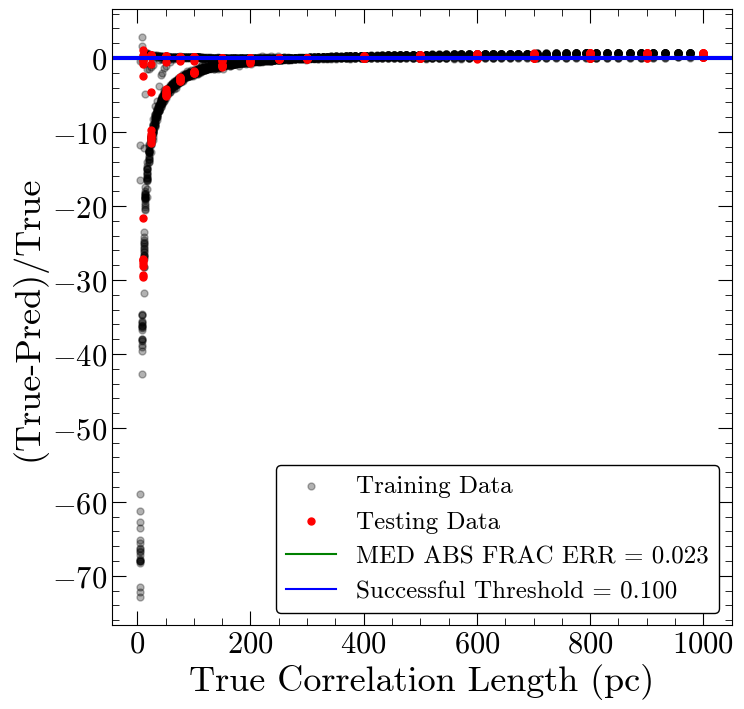

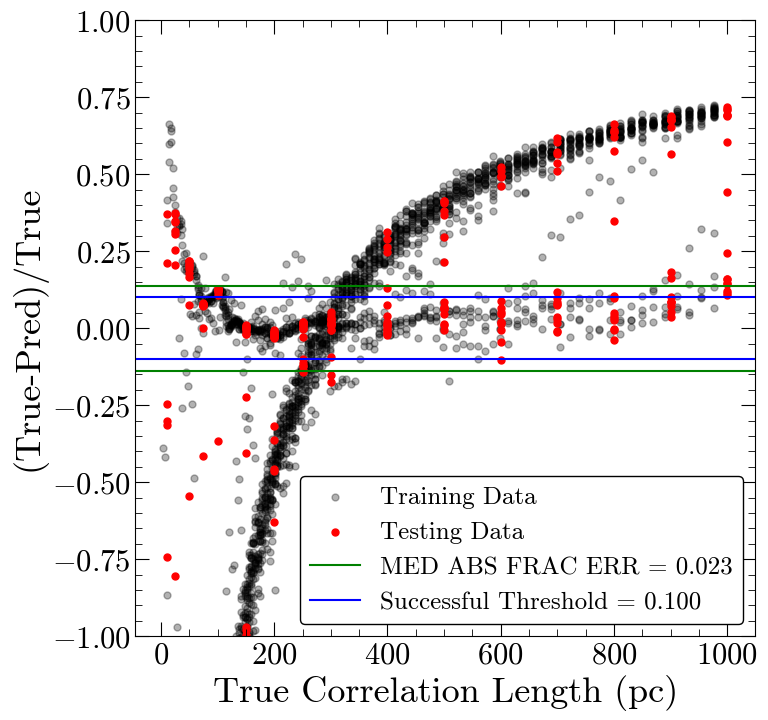

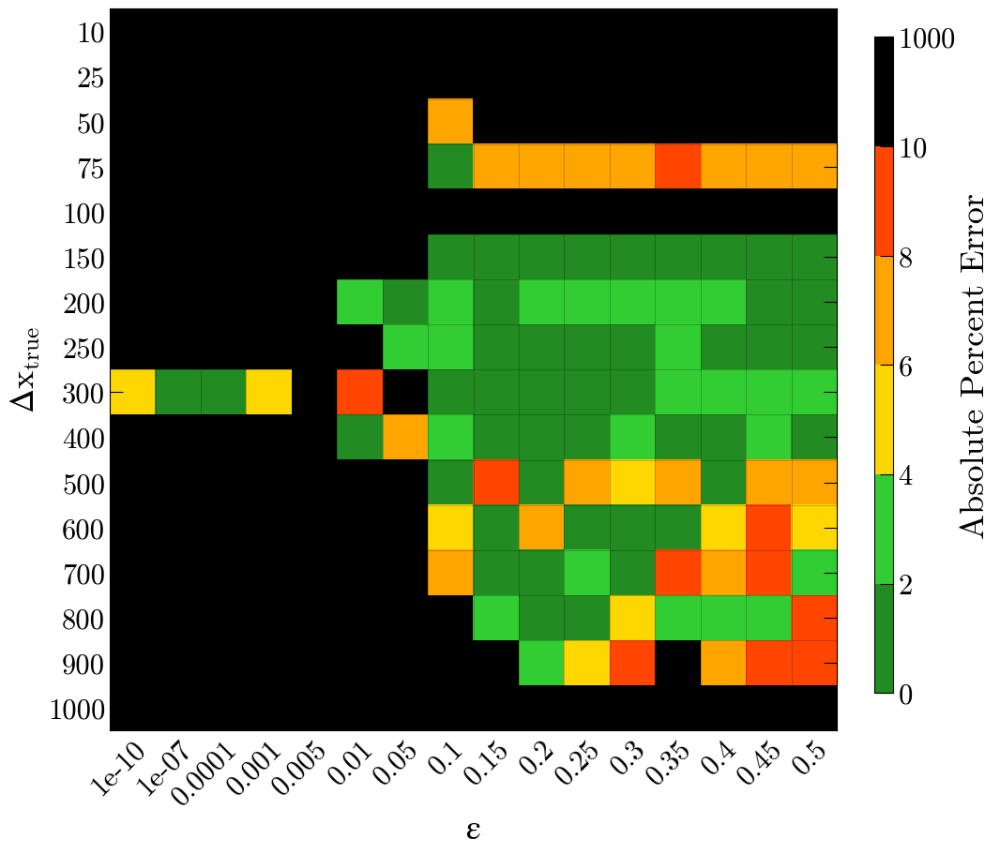

Number of squares with abs percent err>10%,  150


In [43]:
#model with more layers, increase max pooling in first layer
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 2s 13ms/step - loss: 103834.3906
Epoch 2/100
92/92 [==============================] - 1s 9ms/step - loss: 61085.6953
Epoch 3/100
92/92 [==============================] - 1s 10ms/step - loss: 60247.5039
Epoch 4/100
92/92 [==============================] - 1s 11ms/step - loss: 60209.7539
Epoch 5/100
92/92 [==============================] - 1s 11ms/step - loss: 58924.3398
Epoch 6/100
92/92 [==============================] - 1s 9ms/step - loss: 58387.4297
Epoch 7/100
92/92 [==============================] - 1s 8ms/step - loss: 58051.7578
Epoch 8/100
92/92 [==============================] - 1s 9ms/step - loss: 57557.3125
Epoch 9/100
92/92 [==============================] - 1s 11ms/step - loss: 57125.1016
Epoch 10/100
92/92 [==============================] - 1s 9ms/step - loss: 57422.6914
Epoch 11/100
92/92 [==============================] - 1s 14ms/step - loss: 56666.5078
Epoch 12/100
92/92 [==============================] - 1s 9ms/step -

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 231.490 pc
MAE: 155.771 pc
BIAS: -35.653 pc
MED FRAC ERR: 0.492 

Training Stats, Successful Fits
Frac Success Fit: 0.199 
RMSE: 22.892 pc
MAE: 14.690 pc
BIAS: -10.249 pc
MED FRAC ERR: 0.060 

Testing Stats
RMSE: 207.525 pc
MAE: 44.640 pc
BIAS: -18.514 pc
MED FRAC ERR: 0.127 

Testing Stats, Successful Fits
Frac Success Fit: 0.410 
RMSE: 27.219 pc
MAE: 18.298 pc
BIAS: -17.586 pc
MED FRAC ERR: 0.068 


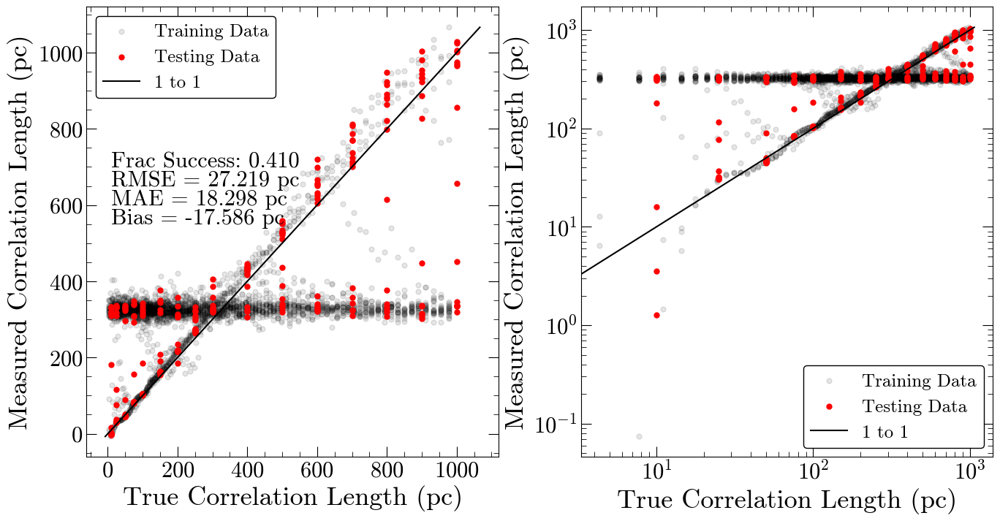

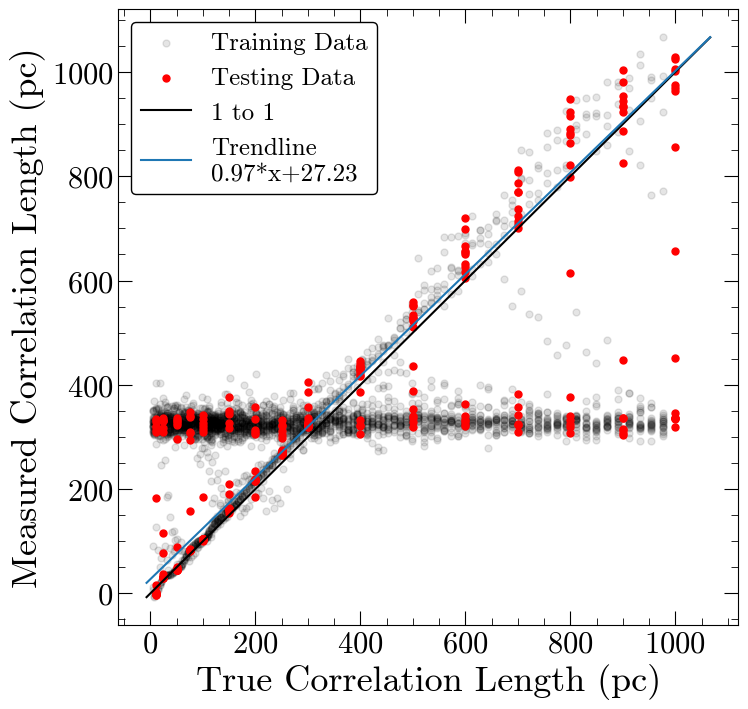

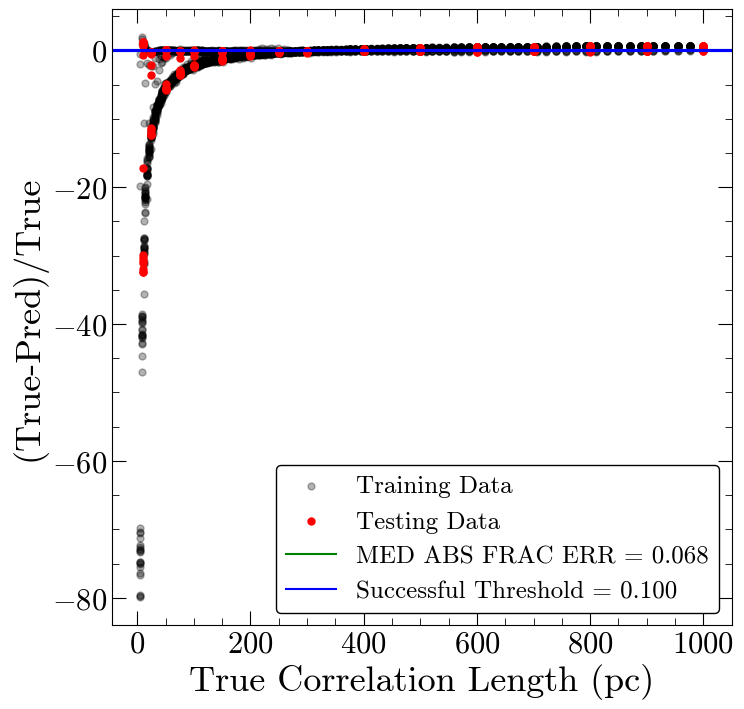

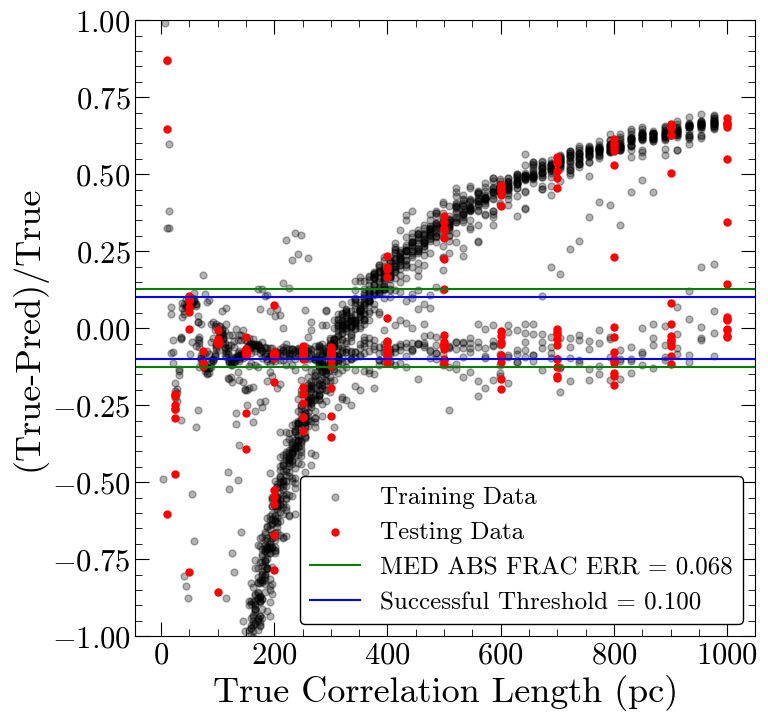

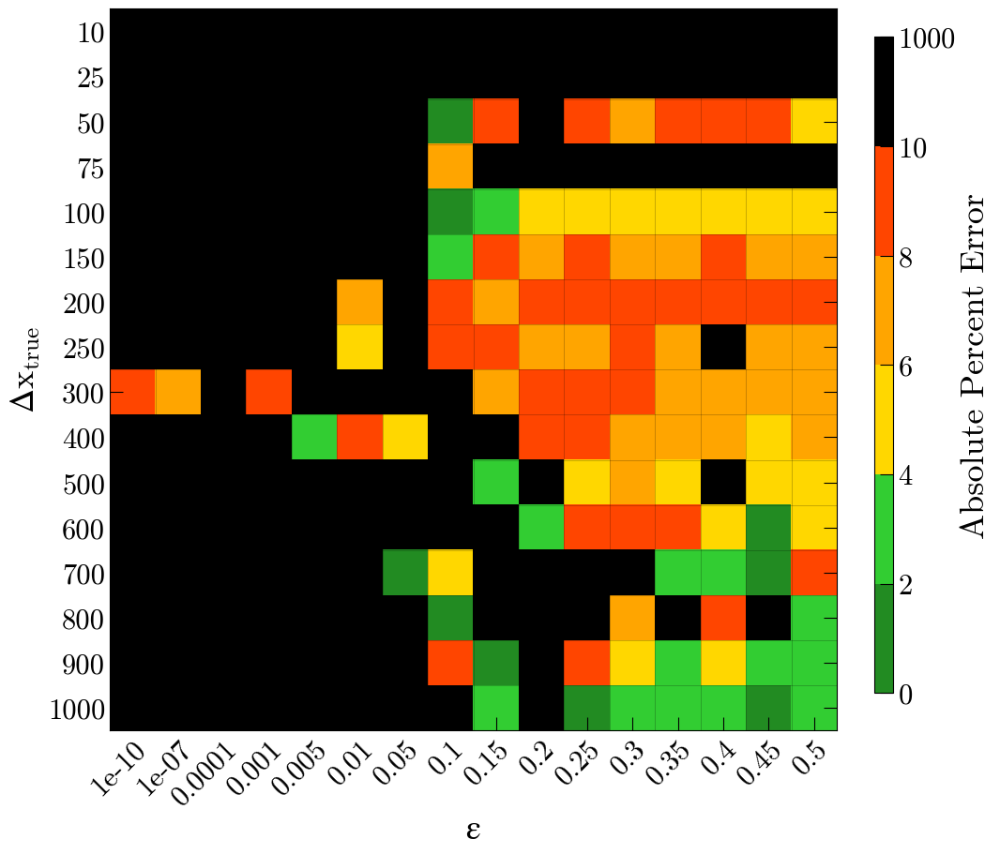

Number of squares with abs percent err>10%,  151


In [44]:
#model with more layers, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 1s 8ms/step - loss: 97576.3047
Epoch 2/200
92/92 [==============================] - 1s 7ms/step - loss: 60751.7852
Epoch 3/200
92/92 [==============================] - 1s 7ms/step - loss: 59772.5430
Epoch 4/200
92/92 [==============================] - 1s 8ms/step - loss: 59384.6875
Epoch 5/200
92/92 [==============================] - 1s 7ms/step - loss: 59061.5977
Epoch 6/200
92/92 [==============================] - 1s 7ms/step - loss: 58137.0703
Epoch 7/200
92/92 [==============================] - 1s 8ms/step - loss: 58027.6406
Epoch 8/200
92/92 [==============================] - 1s 8ms/step - loss: 58021.5781
Epoch 9/200
92/92 [==============================] - 1s 7ms/step - loss: 57473.6094
Epoch 10/200
92/92 [==============================] - 1s 7ms/step - loss: 57347.8945
Epoch 11/200
92/92 [==============================] - 1s 7ms/step - loss: 57137.9102
Epoch 12/200
92/92 [==============================] - 1s 8ms/step - loss: 

92/92 [==============================] - 1s 8ms/step - loss: 53069.0000
Epoch 193/200
92/92 [==============================] - 1s 9ms/step - loss: 53125.4648
Epoch 194/200
92/92 [==============================] - 1s 8ms/step - loss: 53072.8438
Epoch 195/200
92/92 [==============================] - 1s 8ms/step - loss: 52852.6289
Epoch 196/200
92/92 [==============================] - 1s 7ms/step - loss: 52819.8086
Epoch 197/200
92/92 [==============================] - 1s 7ms/step - loss: 53075.2812
Epoch 198/200
92/92 [==============================] - 1s 7ms/step - loss: 52969.3398
Epoch 199/200
92/92 [==============================] - 1s 7ms/step - loss: 53082.3320
Epoch 200/200
92/92 [==============================] - 1s 8ms/step - loss: 53372.1055

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 230.638 pc
MAE: 139.347 pc
BIAS: -21.374 pc
MED FRAC ERR: 0.483 

Training Stats, Successful Fits
Frac Success Fit: 0.159 
RMSE: 21.359 pc
MAE: 14.058 pc
BIAS: -1.311 pc
MED FRAC ERR: 0.042 

Testing Stats
RMSE: 209.592 pc
MAE: 33.871 pc
BIAS: -10.298 pc
MED FRAC ERR: 0.163 

Testing Stats, Successful Fits
Frac Success Fit: 0.332 
RMSE: 25.807 pc
MAE: 13.028 pc
BIAS: -1.447 pc
MED FRAC ERR: 0.034 


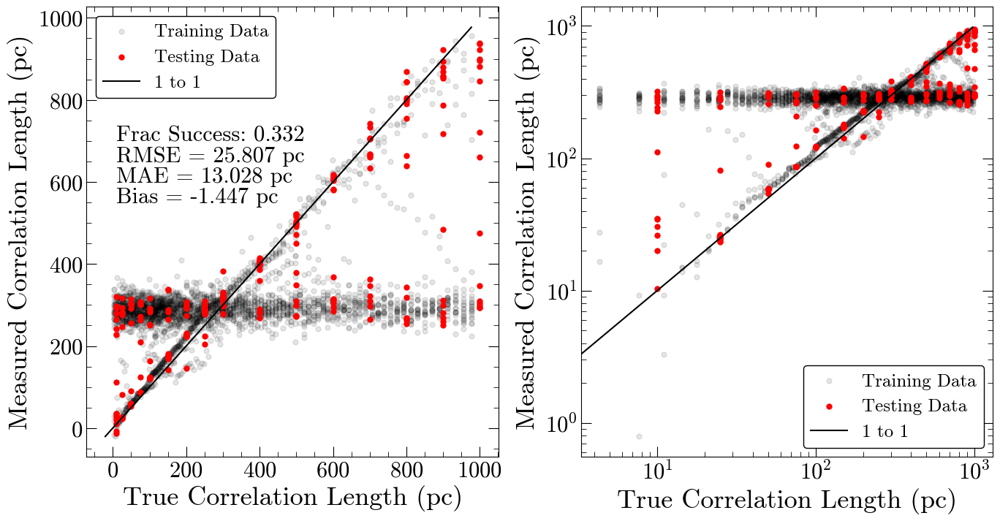

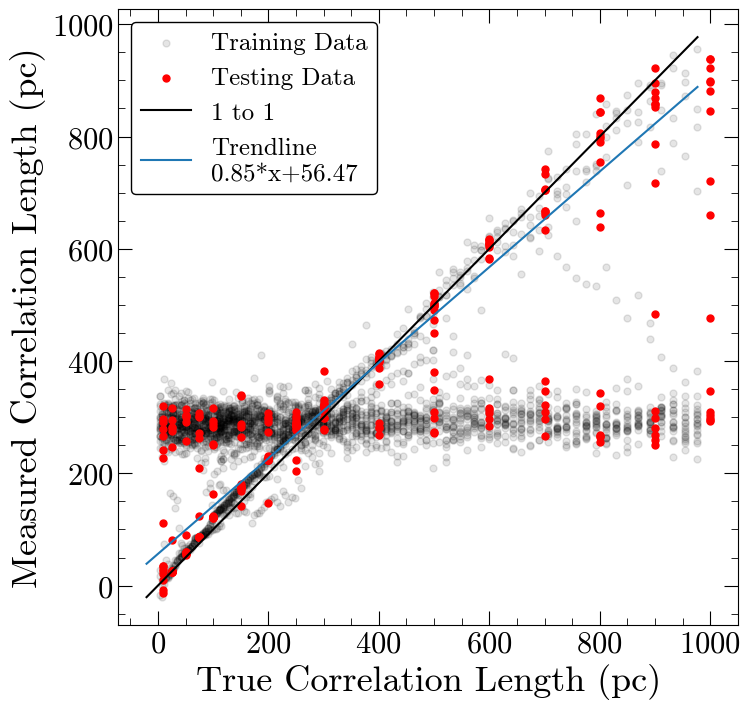

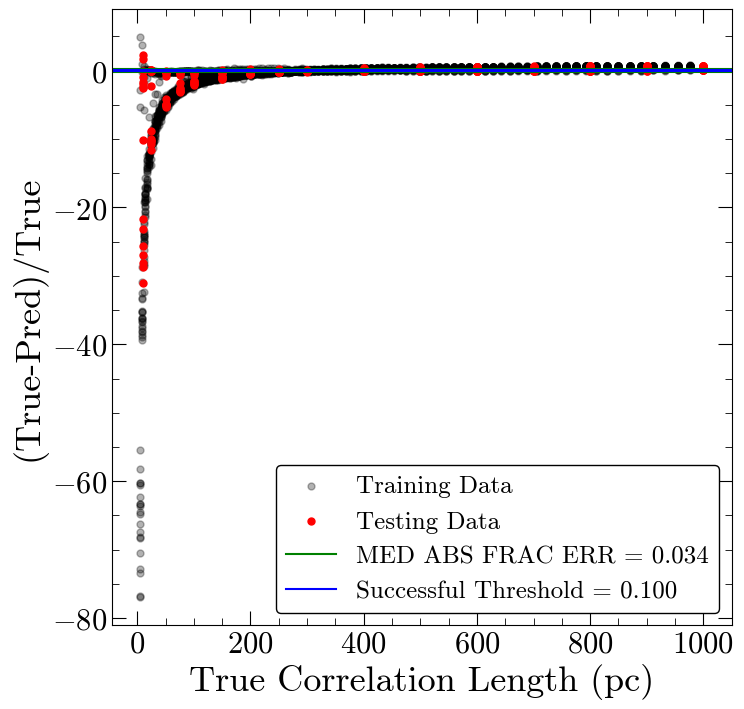

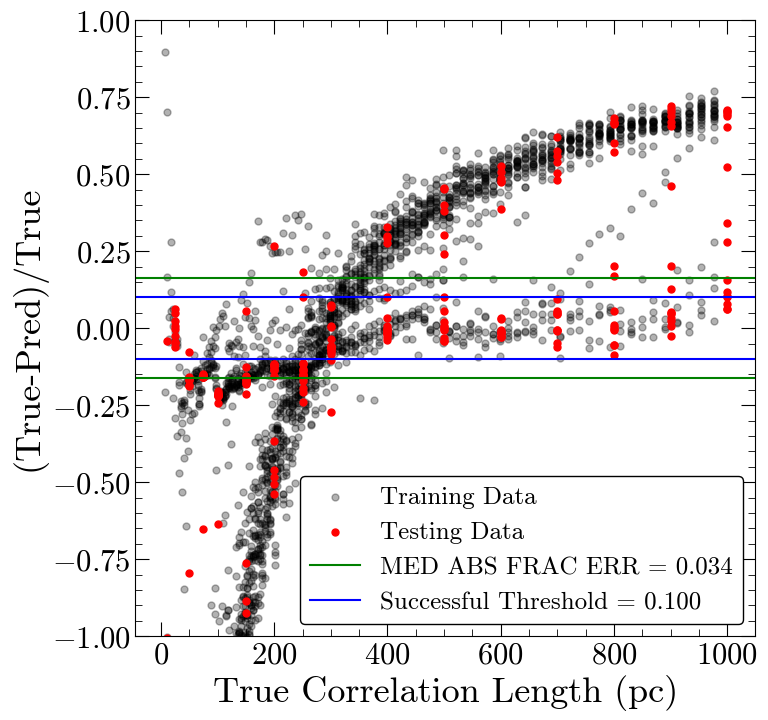

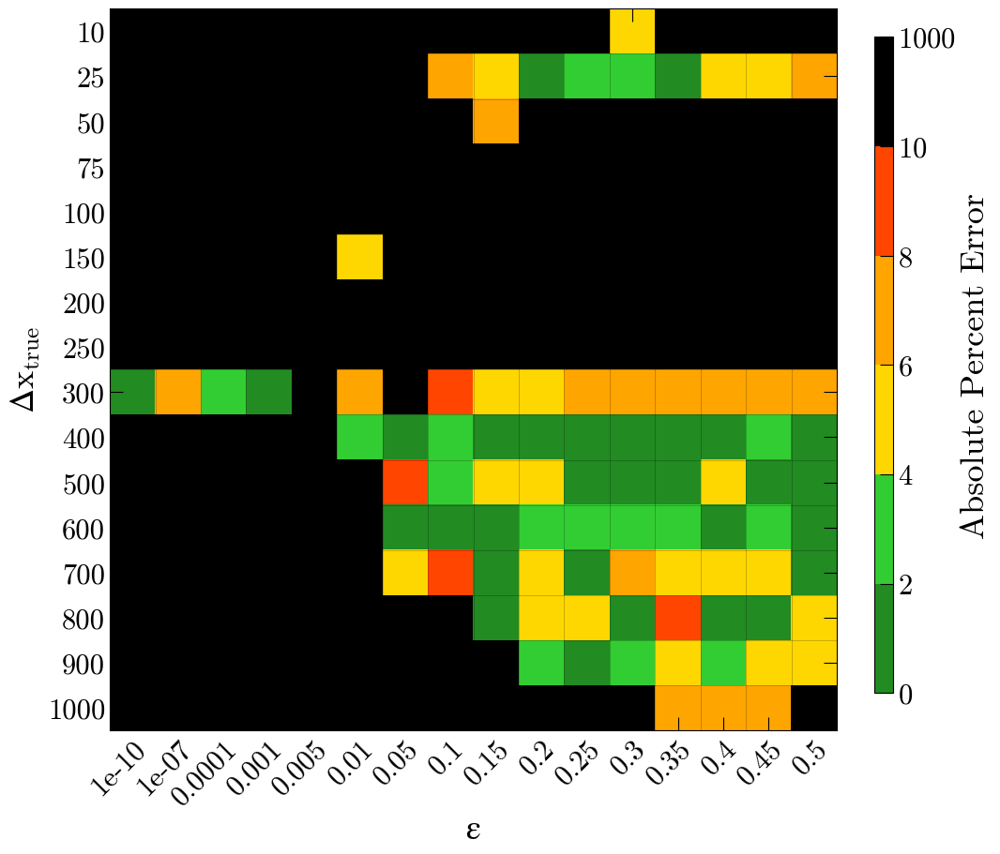

Number of squares with abs percent err>10%,  171


In [45]:
#model with more layers, run for more epochs, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 1s 9ms/step - loss: 98860.2500
Epoch 2/400
92/92 [==============================] - 1s 8ms/step - loss: 59773.9570
Epoch 3/400
92/92 [==============================] - 1s 9ms/step - loss: 58593.1953
Epoch 4/400
92/92 [==============================] - 1s 9ms/step - loss: 58747.4961
Epoch 5/400
92/92 [==============================] - 1s 8ms/step - loss: 57810.9922
Epoch 6/400
92/92 [==============================] - 1s 8ms/step - loss: 57309.2227
Epoch 7/400
92/92 [==============================] - 1s 9ms/step - loss: 57467.7656
Epoch 8/400
92/92 [==============================] - 1s 9ms/step - loss: 57067.8750
Epoch 9/400
92/92 [==============================] - 1s 7ms/step - loss: 56754.4492
Epoch 10/400
92/92 [==============================] - 1s 7ms/step - loss: 56729.7188
Epoch 11/400
92/92 [==============================] - 1s 8ms/step - loss: 56182.6133
Epoch 12/400
92/92 [==============================] - 1s 7ms/step - loss: 

92/92 [==============================] - 1s 9ms/step - loss: 53872.8320
Epoch 192/400
92/92 [==============================] - 1s 9ms/step - loss: 53761.6992
Epoch 193/400
92/92 [==============================] - 1s 11ms/step - loss: 53240.0312
Epoch 194/400
92/92 [==============================] - 1s 9ms/step - loss: 53631.0312
Epoch 195/400
92/92 [==============================] - 1s 9ms/step - loss: 53482.4062
Epoch 196/400
92/92 [==============================] - 1s 10ms/step - loss: 53433.0703
Epoch 197/400
92/92 [==============================] - 1s 10ms/step - loss: 53526.8672
Epoch 198/400
92/92 [==============================] - 1s 9ms/step - loss: 53586.8438
Epoch 199/400
92/92 [==============================] - 1s 10ms/step - loss: 53240.1953
Epoch 200/400
92/92 [==============================] - 1s 11ms/step - loss: 53299.4609
Epoch 201/400
92/92 [==============================] - 1s 9ms/step - loss: 53410.9375
Epoch 202/400
92/92 [==============================] - 1s 9ms/s

92/92 [==============================] - 1s 11ms/step - loss: 52663.2969
Epoch 380/400
92/92 [==============================] - 1s 9ms/step - loss: 52507.6445
Epoch 381/400
92/92 [==============================] - 1s 10ms/step - loss: 52716.7773
Epoch 382/400
92/92 [==============================] - 1s 10ms/step - loss: 52629.2305
Epoch 383/400
92/92 [==============================] - 1s 9ms/step - loss: 52655.6641
Epoch 384/400
92/92 [==============================] - 1s 10ms/step - loss: 52557.3867
Epoch 385/400
92/92 [==============================] - 1s 9ms/step - loss: 52379.0586
Epoch 386/400
92/92 [==============================] - 1s 10ms/step - loss: 52774.8789
Epoch 387/400
92/92 [==============================] - 1s 10ms/step - loss: 52929.1016
Epoch 388/400
92/92 [==============================] - 1s 10ms/step - loss: 52406.6484
Epoch 389/400
92/92 [==============================] - 1s 11ms/step - loss: 52536.3711
Epoch 390/400
92/92 [==============================] - 1s 10

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 228.661 pc
MAE: 154.023 pc
BIAS: -11.731 pc
MED FRAC ERR: 0.476 

Training Stats, Successful Fits
Frac Success Fit: 0.258 
RMSE: 16.574 pc
MAE: 5.087 pc
BIAS: 2.138 pc
MED FRAC ERR: 0.022 

Testing Stats
RMSE: 201.583 pc
MAE: 20.015 pc
BIAS: 1.671 pc
MED FRAC ERR: 0.067 

Testing Stats, Successful Fits
Frac Success Fit: 0.539 
RMSE: 17.898 pc
MAE: 4.393 pc
BIAS: 1.768 pc
MED FRAC ERR: 0.021 


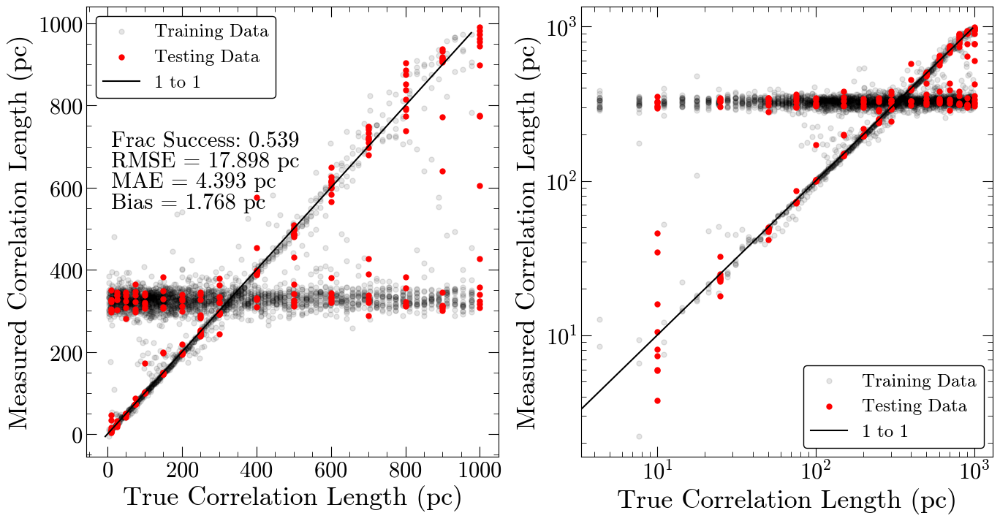

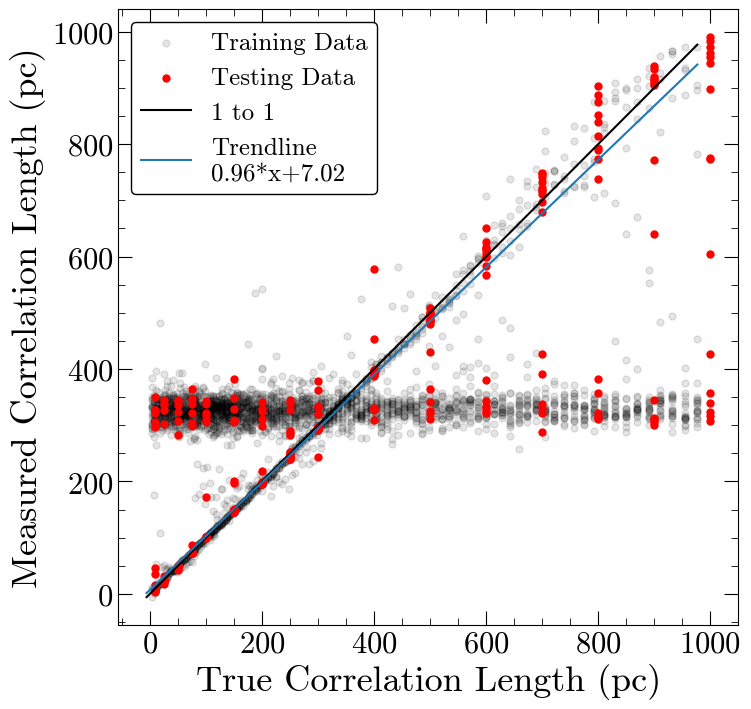

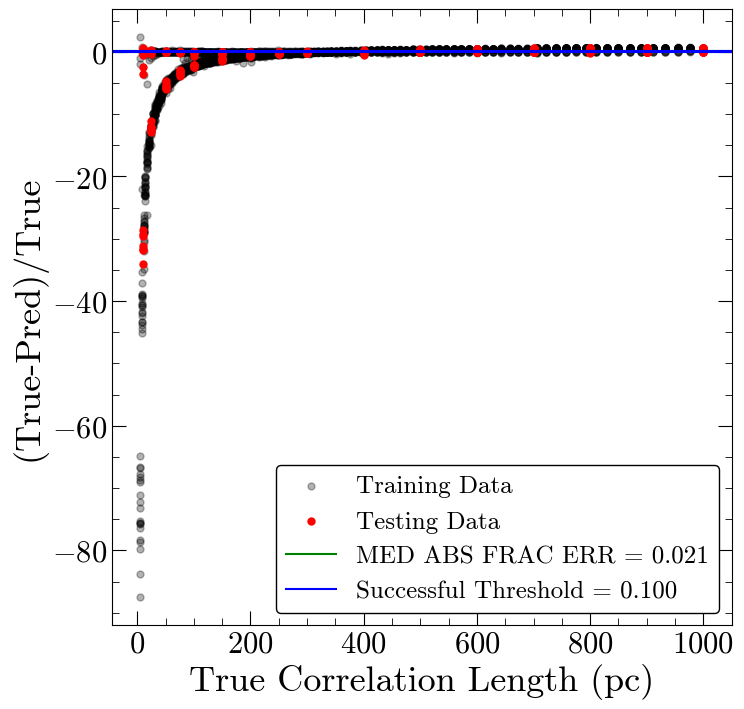

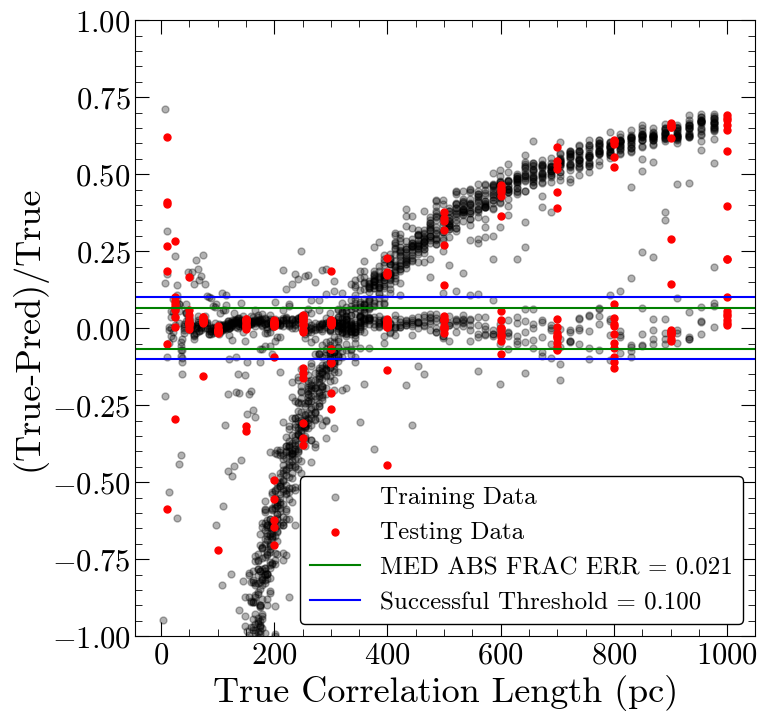

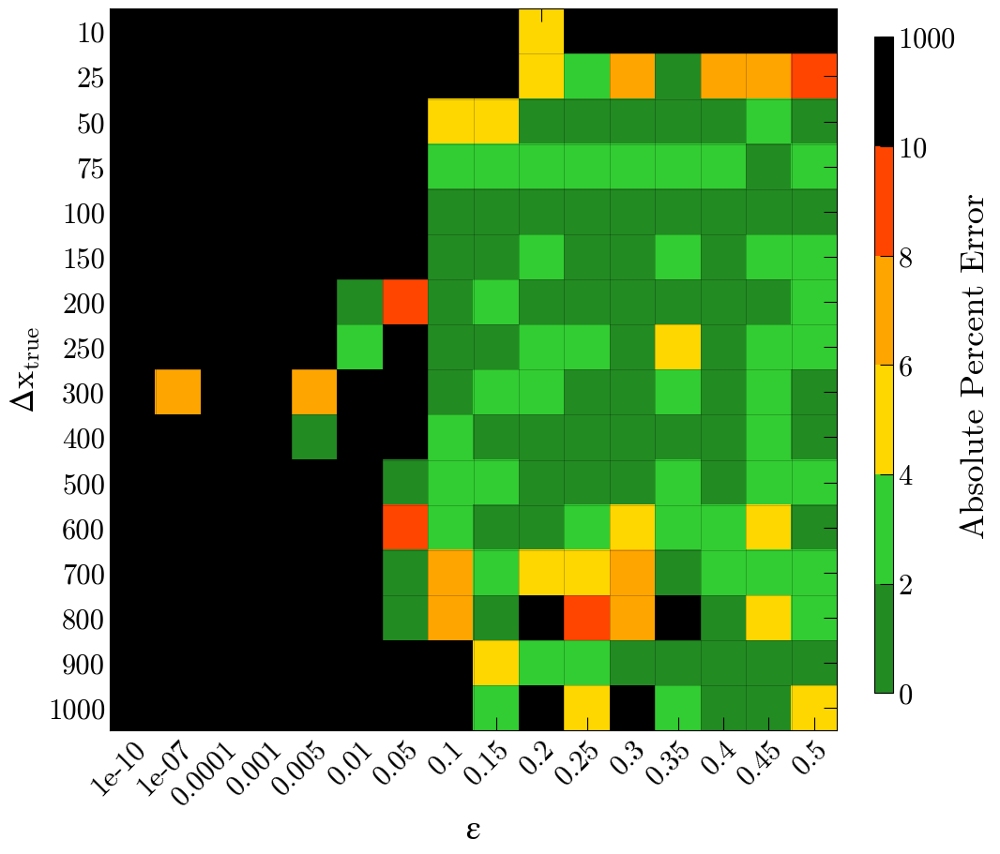

Number of squares with abs percent err>10%,  118


In [46]:
#model with more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 1s 10ms/step - loss: 96507.1484
Epoch 2/400
92/92 [==============================] - 1s 10ms/step - loss: 60015.8672
Epoch 3/400
92/92 [==============================] - 1s 10ms/step - loss: 58483.4727
Epoch 4/400
92/92 [==============================] - 1s 11ms/step - loss: 57924.8047
Epoch 5/400
92/92 [==============================] - 1s 10ms/step - loss: 57740.5430
Epoch 6/400
92/92 [==============================] - 1s 10ms/step - loss: 57732.7930
Epoch 7/400
92/92 [==============================] - 1s 10ms/step - loss: 56715.9023
Epoch 8/400
92/92 [==============================] - 1s 10ms/step - loss: 57091.3750
Epoch 9/400
92/92 [==============================] - 1s 11ms/step - loss: 56150.4258
Epoch 10/400
92/92 [==============================] - 1s 9ms/step - loss: 56896.3398
Epoch 11/400
92/92 [==============================] - 1s 10ms/step - loss: 56248.6328
Epoch 12/400
92/92 [==============================] - 1s 11ms/st

92/92 [==============================] - 1s 10ms/step - loss: 53420.0391
Epoch 191/400
92/92 [==============================] - 1s 12ms/step - loss: 53305.1406
Epoch 192/400
92/92 [==============================] - 1s 11ms/step - loss: 53571.3125
Epoch 193/400
92/92 [==============================] - 1s 11ms/step - loss: 53410.2305
Epoch 194/400
92/92 [==============================] - 1s 12ms/step - loss: 53718.8047
Epoch 195/400
92/92 [==============================] - 1s 12ms/step - loss: 53447.2852
Epoch 196/400
92/92 [==============================] - 1s 11ms/step - loss: 53381.8711
Epoch 197/400
92/92 [==============================] - 1s 10ms/step - loss: 53198.1172
Epoch 198/400
92/92 [==============================] - 1s 12ms/step - loss: 53678.9141
Epoch 199/400
92/92 [==============================] - 1s 13ms/step - loss: 53273.0977
Epoch 200/400
92/92 [==============================] - 1s 13ms/step - loss: 53305.5977
Epoch 201/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 13ms/step - loss: 52296.6016
Epoch 379/400
92/92 [==============================] - 1s 13ms/step - loss: 52251.7070
Epoch 380/400
92/92 [==============================] - 1s 14ms/step - loss: 52387.8086
Epoch 381/400
92/92 [==============================] - 1s 14ms/step - loss: 52317.5078
Epoch 382/400
92/92 [==============================] - 1s 13ms/step - loss: 52783.3906
Epoch 383/400
92/92 [==============================] - 1s 11ms/step - loss: 52742.4297
Epoch 384/400
92/92 [==============================] - 1s 13ms/step - loss: 52577.8828
Epoch 385/400
92/92 [==============================] - 1s 13ms/step - loss: 52729.8633
Epoch 386/400
92/92 [==============================] - 1s 11ms/step - loss: 52624.0547
Epoch 387/400
92/92 [==============================] - 1s 11ms/step - loss: 52359.3945
Epoch 388/400
92/92 [==============================] - 1s 11ms/step - loss: 52501.8828
Epoch 389/400
92/92 [==============================] - 1s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 228.606 pc
MAE: 144.593 pc
BIAS: -5.855 pc
MED FRAC ERR: 0.479 

Training Stats, Successful Fits
Frac Success Fit: 0.263 
RMSE: 16.151 pc
MAE: 5.407 pc
BIAS: 0.234 pc
MED FRAC ERR: 0.027 

Testing Stats
RMSE: 205.183 pc
MAE: 23.286 pc
BIAS: 0.429 pc
MED FRAC ERR: 0.057 

Testing Stats, Successful Fits
Frac Success Fit: 0.574 
RMSE: 21.075 pc
MAE: 4.717 pc
BIAS: 0.384 pc
MED FRAC ERR: 0.022 


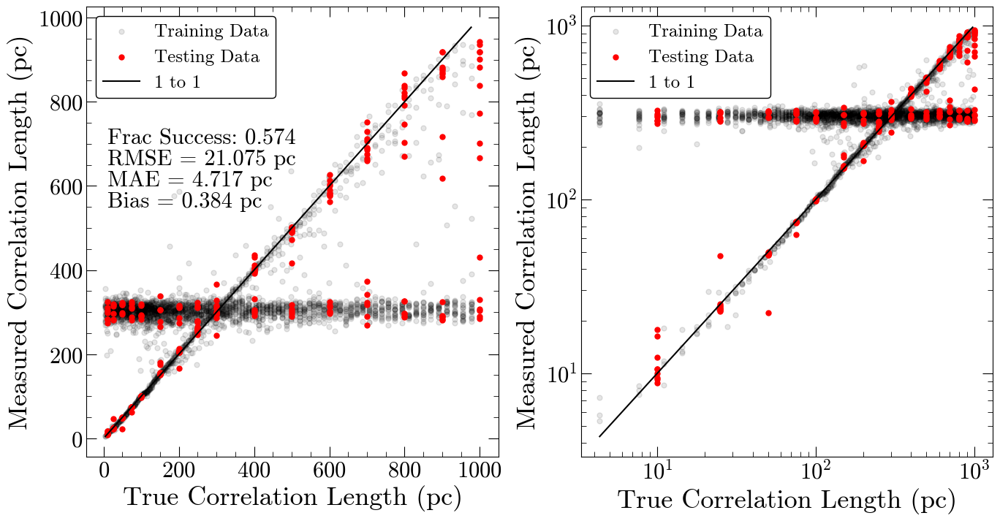

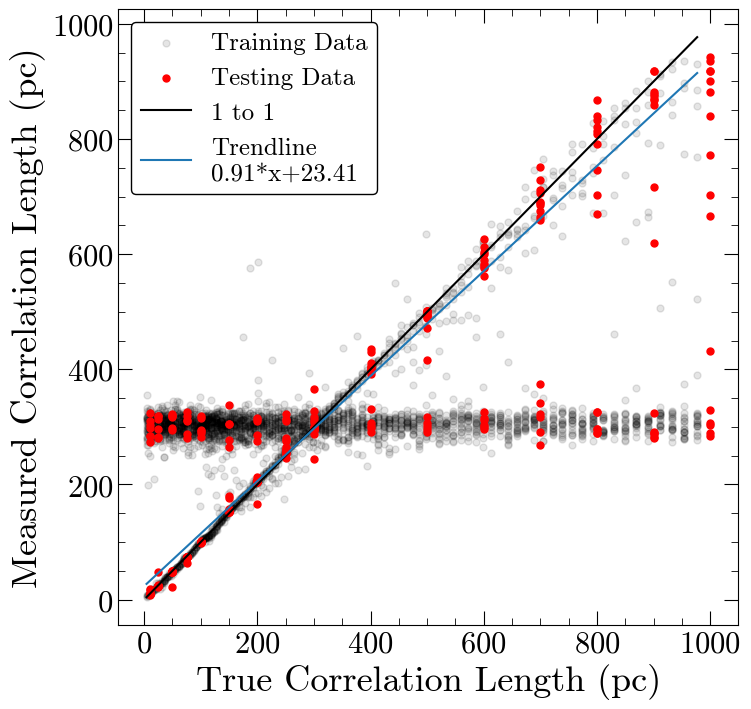

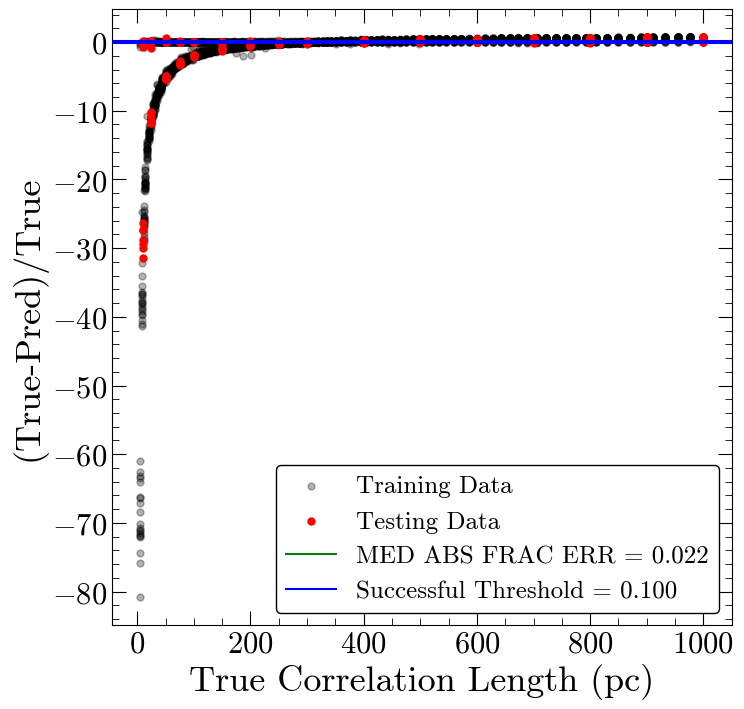

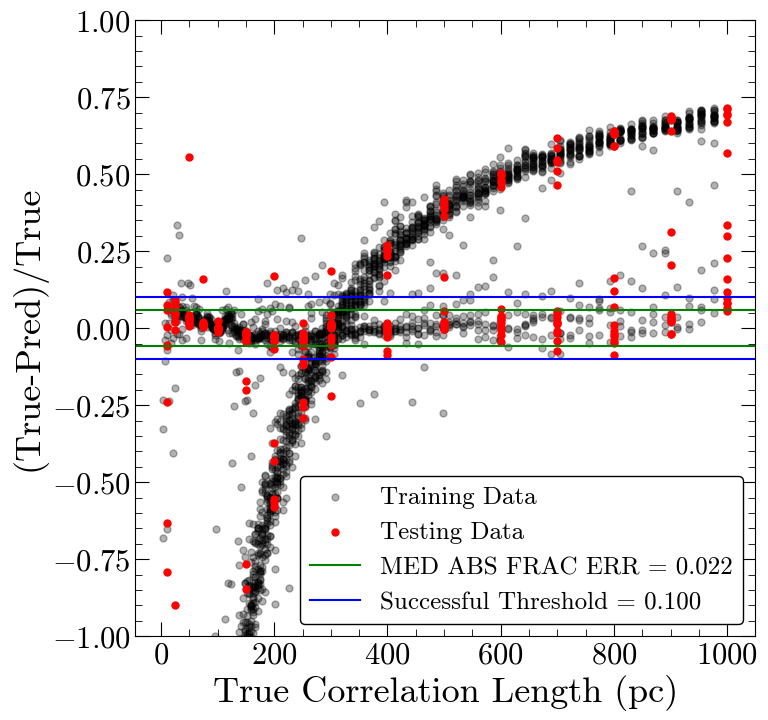

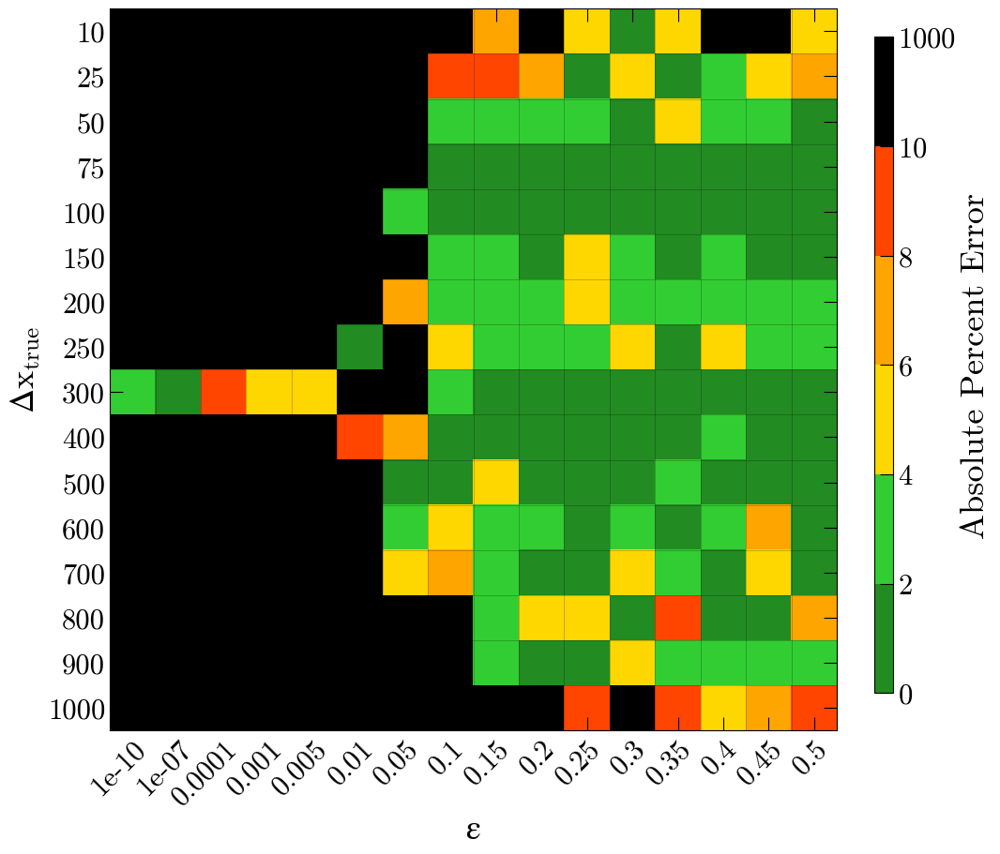

Number of squares with abs percent err>10%,  109


In [47]:
#model with even more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
46/46 [==============================] - 2s 18ms/step - loss: 130214.9453
Epoch 2/400
46/46 [==============================] - 1s 12ms/step - loss: 63964.5859
Epoch 3/400
46/46 [==============================] - 1s 17ms/step - loss: 61217.9492
Epoch 4/400
46/46 [==============================] - 1s 14ms/step - loss: 58664.3438
Epoch 5/400
46/46 [==============================] - 1s 13ms/step - loss: 58220.0391
Epoch 6/400
46/46 [==============================] - 1s 13ms/step - loss: 58120.0195
Epoch 7/400
46/46 [==============================] - 1s 13ms/step - loss: 57938.6836
Epoch 8/400
46/46 [==============================] - 1s 15ms/step - loss: 57331.1367
Epoch 9/400
46/46 [==============================] - 1s 13ms/step - loss: 57166.3359
Epoch 10/400
46/46 [==============================] - 1s 12ms/step - loss: 57105.3906
Epoch 11/400
46/46 [==============================] - 1s 13ms/step - loss: 56626.2422
Epoch 12/400
46/46 [==============================] - 1s 14ms/

46/46 [==============================] - 1s 12ms/step - loss: 53193.1758
Epoch 191/400
46/46 [==============================] - 1s 12ms/step - loss: 53887.3984
Epoch 192/400
46/46 [==============================] - 1s 13ms/step - loss: 53505.3594
Epoch 193/400
46/46 [==============================] - 1s 13ms/step - loss: 53367.0156
Epoch 194/400
46/46 [==============================] - 1s 13ms/step - loss: 53688.2773
Epoch 195/400
46/46 [==============================] - 1s 12ms/step - loss: 53036.2656
Epoch 196/400
46/46 [==============================] - 1s 12ms/step - loss: 53703.1367
Epoch 197/400
46/46 [==============================] - 1s 12ms/step - loss: 53373.5508
Epoch 198/400
46/46 [==============================] - 1s 13ms/step - loss: 53262.3906
Epoch 199/400
46/46 [==============================] - 1s 13ms/step - loss: 53399.3945
Epoch 200/400
46/46 [==============================] - 1s 14ms/step - loss: 53421.0820
Epoch 201/400
46/46 [==============================] - 1s

46/46 [==============================] - 0s 10ms/step - loss: 52793.3789
Epoch 379/400
46/46 [==============================] - 1s 13ms/step - loss: 52464.9492
Epoch 380/400
46/46 [==============================] - 1s 12ms/step - loss: 52859.5703
Epoch 381/400
46/46 [==============================] - 1s 13ms/step - loss: 52889.0586
Epoch 382/400
46/46 [==============================] - 1s 11ms/step - loss: 52560.2969
Epoch 383/400
46/46 [==============================] - 0s 10ms/step - loss: 52624.0391
Epoch 384/400
46/46 [==============================] - 1s 14ms/step - loss: 52494.1172
Epoch 385/400
46/46 [==============================] - 1s 12ms/step - loss: 53314.6055
Epoch 386/400
46/46 [==============================] - 1s 14ms/step - loss: 53683.0195
Epoch 387/400
46/46 [==============================] - 1s 11ms/step - loss: 52922.4883
Epoch 388/400
46/46 [==============================] - 1s 14ms/step - loss: 52602.9453
Epoch 389/400
46/46 [==============================] - 1s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 229.392 pc
MAE: 156.089 pc
BIAS: -8.673 pc
MED FRAC ERR: 0.473 

Training Stats, Successful Fits
Frac Success Fit: 0.230 
RMSE: 22.332 pc
MAE: 11.772 pc
BIAS: 9.807 pc
MED FRAC ERR: 0.060 

Testing Stats
RMSE: 201.565 pc
MAE: 34.463 pc
BIAS: 14.119 pc
MED FRAC ERR: 0.103 

Testing Stats, Successful Fits
Frac Success Fit: 0.480 
RMSE: 27.187 pc
MAE: 15.539 pc
BIAS: 11.948 pc
MED FRAC ERR: 0.062 


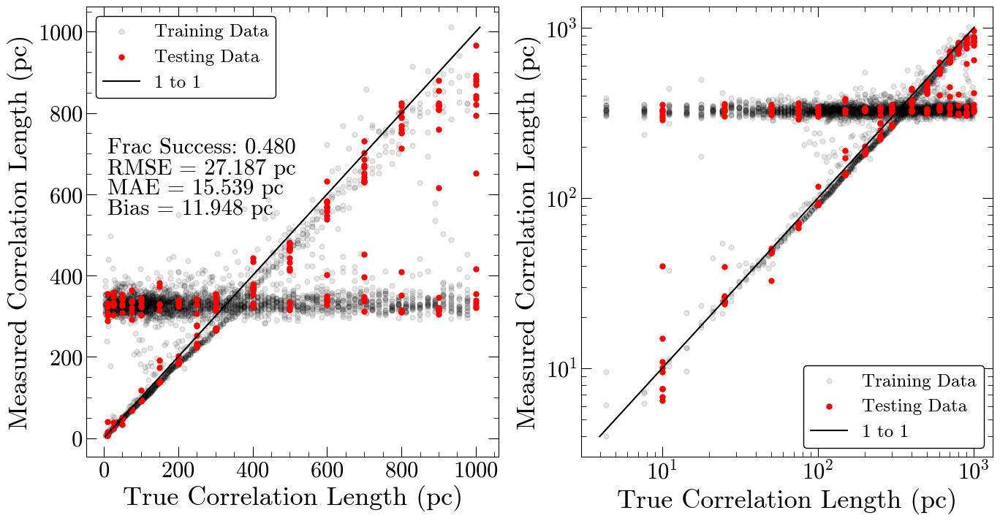

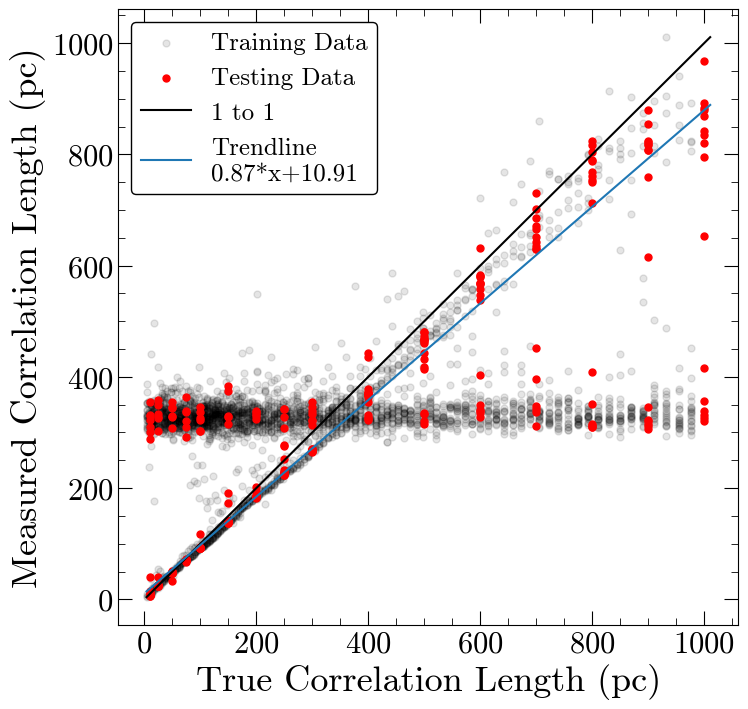

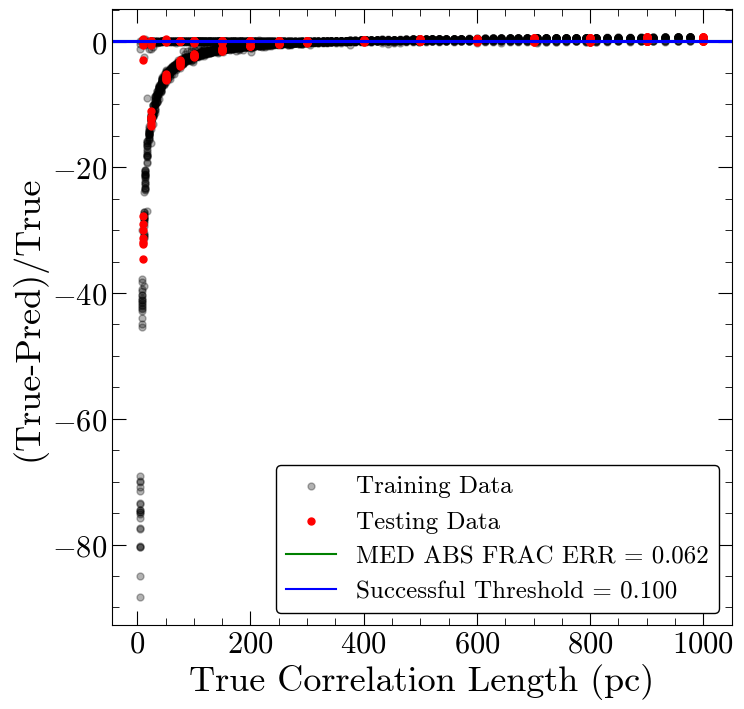

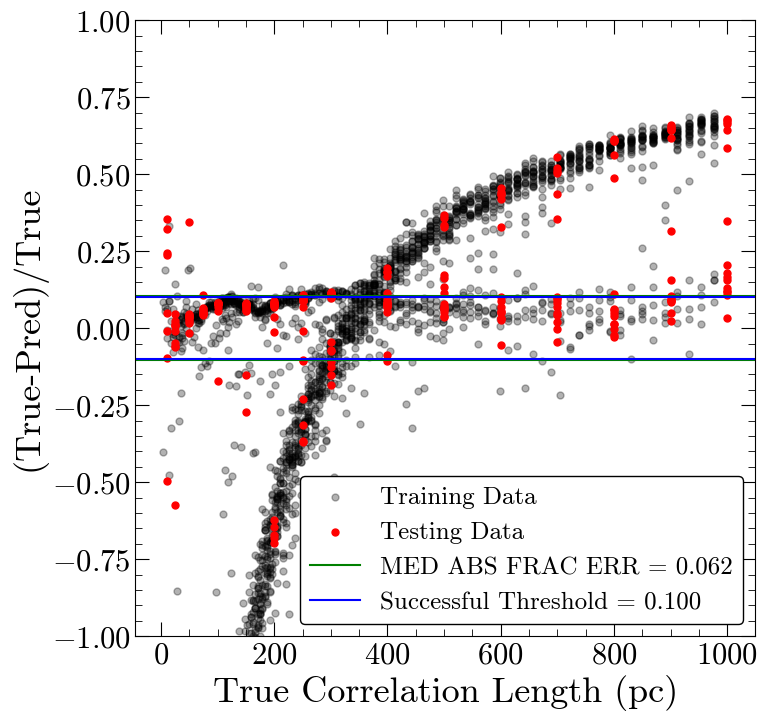

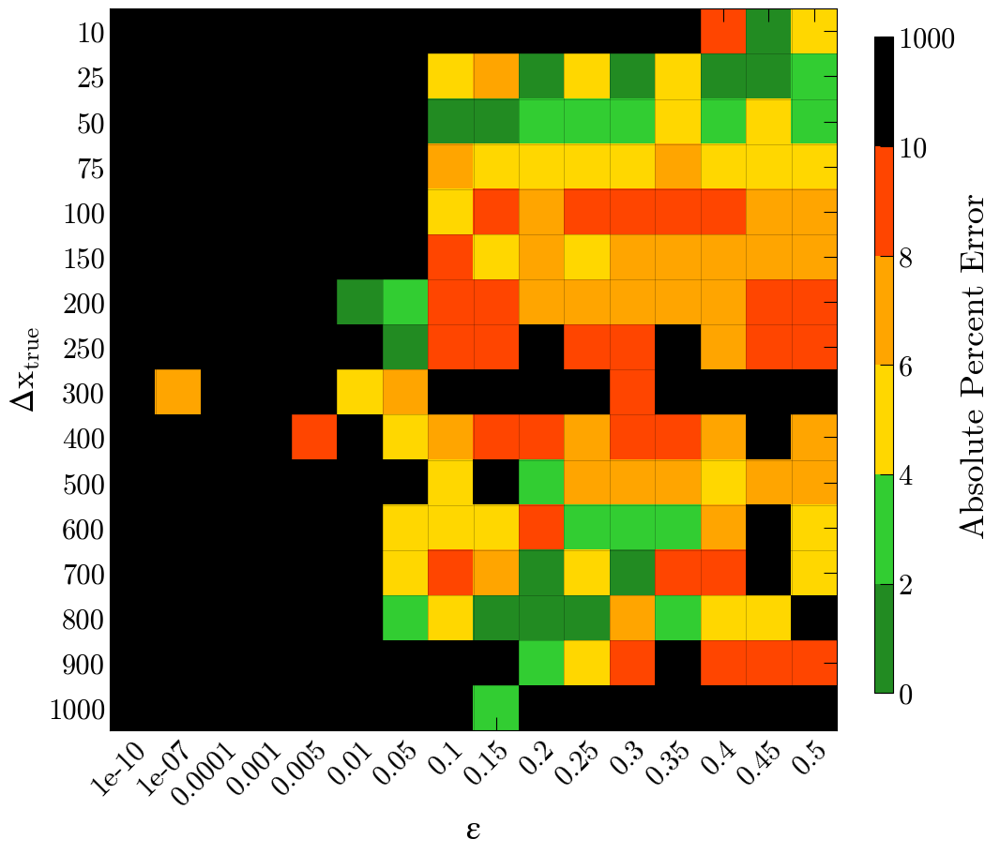

Number of squares with abs percent err>10%,  133


In [48]:
#model with even more layers, run for even more epochs, increase batch size
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=64)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
10/10 [==============================] - 1s 41ms/step - loss: 164141.9062
Epoch 2/400
10/10 [==============================] - 0s 42ms/step - loss: 160550.5312
Epoch 3/400
10/10 [==============================] - 0s 30ms/step - loss: 132758.0781
Epoch 4/400
10/10 [==============================] - 0s 31ms/step - loss: 76083.1953
Epoch 5/400
10/10 [==============================] - 0s 27ms/step - loss: 67002.6953
Epoch 6/400
10/10 [==============================] - 0s 34ms/step - loss: 64178.0039
Epoch 7/400
10/10 [==============================] - 0s 28ms/step - loss: 62344.6641
Epoch 8/400
10/10 [==============================] - 0s 28ms/step - loss: 61574.0234
Epoch 9/400
10/10 [==============================] - 0s 28ms/step - loss: 60554.6484
Epoch 10/400
10/10 [==============================] - 0s 34ms/step - loss: 60082.8594
Epoch 11/400
10/10 [==============================] - 0s 33ms/step - loss: 59687.2070
Epoch 12/400
10/10 [==============================] - 0s 31m

10/10 [==============================] - 0s 38ms/step - loss: 53753.5625
Epoch 191/400
10/10 [==============================] - 0s 36ms/step - loss: 53756.1445
Epoch 192/400
10/10 [==============================] - 0s 27ms/step - loss: 54191.1953
Epoch 193/400
10/10 [==============================] - 0s 33ms/step - loss: 54645.3633
Epoch 194/400
10/10 [==============================] - 0s 29ms/step - loss: 54446.8125
Epoch 195/400
10/10 [==============================] - 0s 36ms/step - loss: 54325.6523
Epoch 196/400
10/10 [==============================] - 0s 31ms/step - loss: 53968.9141
Epoch 197/400
10/10 [==============================] - 0s 30ms/step - loss: 53923.9062
Epoch 198/400
10/10 [==============================] - 0s 32ms/step - loss: 54077.4961
Epoch 199/400
10/10 [==============================] - 0s 42ms/step - loss: 54257.1875
Epoch 200/400
10/10 [==============================] - 0s 26ms/step - loss: 53992.3750
Epoch 201/400
10/10 [==============================] - 0s

10/10 [==============================] - 0s 28ms/step - loss: 52637.4297
Epoch 379/400
10/10 [==============================] - 0s 28ms/step - loss: 52758.4258
Epoch 380/400
10/10 [==============================] - 0s 26ms/step - loss: 52669.9023
Epoch 381/400
10/10 [==============================] - 0s 30ms/step - loss: 52700.5391
Epoch 382/400
10/10 [==============================] - 0s 31ms/step - loss: 53508.8047
Epoch 383/400
10/10 [==============================] - 0s 32ms/step - loss: 54306.9102
Epoch 384/400
10/10 [==============================] - 0s 38ms/step - loss: 53375.0312
Epoch 385/400
10/10 [==============================] - 0s 27ms/step - loss: 52920.6211
Epoch 386/400
10/10 [==============================] - 0s 30ms/step - loss: 52761.0508
Epoch 387/400
10/10 [==============================] - 0s 35ms/step - loss: 52745.9102
Epoch 388/400
10/10 [==============================] - 0s 26ms/step - loss: 52988.1367
Epoch 389/400
10/10 [==============================] - 0s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 229.067 pc
MAE: 148.927 pc
BIAS: -15.265 pc
MED FRAC ERR: 0.470 

Training Stats, Successful Fits
Frac Success Fit: 0.262 
RMSE: 17.865 pc
MAE: 6.813 pc
BIAS: -3.189 pc
MED FRAC ERR: 0.031 

Testing Stats
RMSE: 204.812 pc
MAE: 30.045 pc
BIAS: -4.045 pc
MED FRAC ERR: 0.077 

Testing Stats, Successful Fits
Frac Success Fit: 0.539 
RMSE: 24.529 pc
MAE: 9.237 pc
BIAS: -4.045 pc
MED FRAC ERR: 0.034 


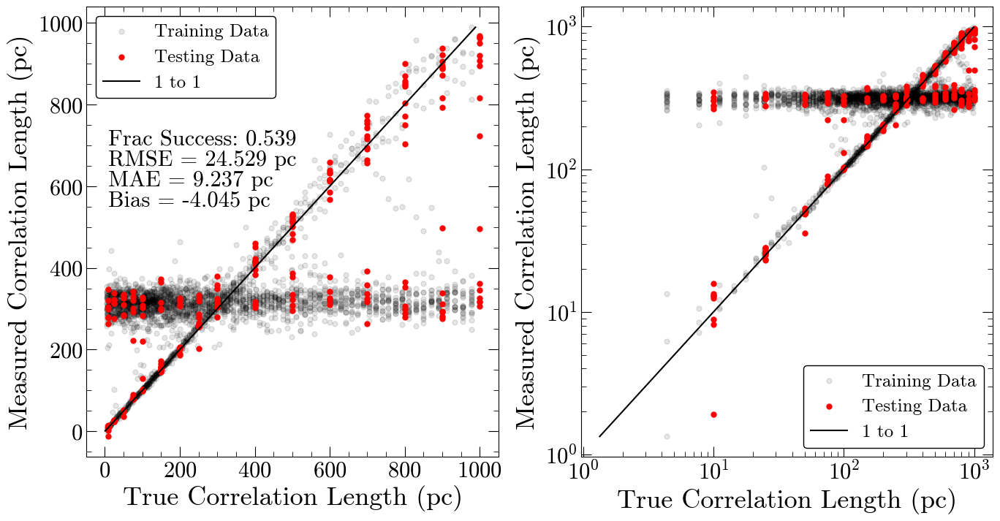

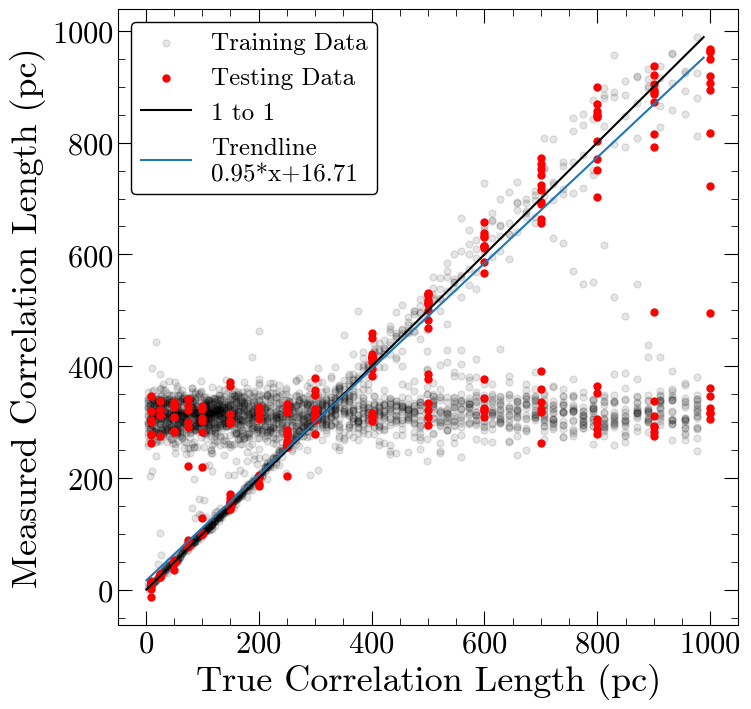

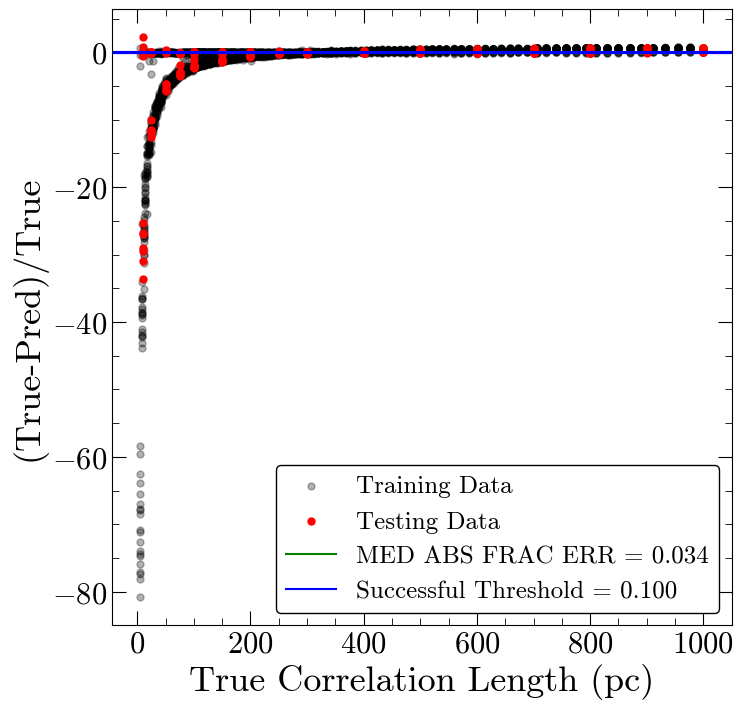

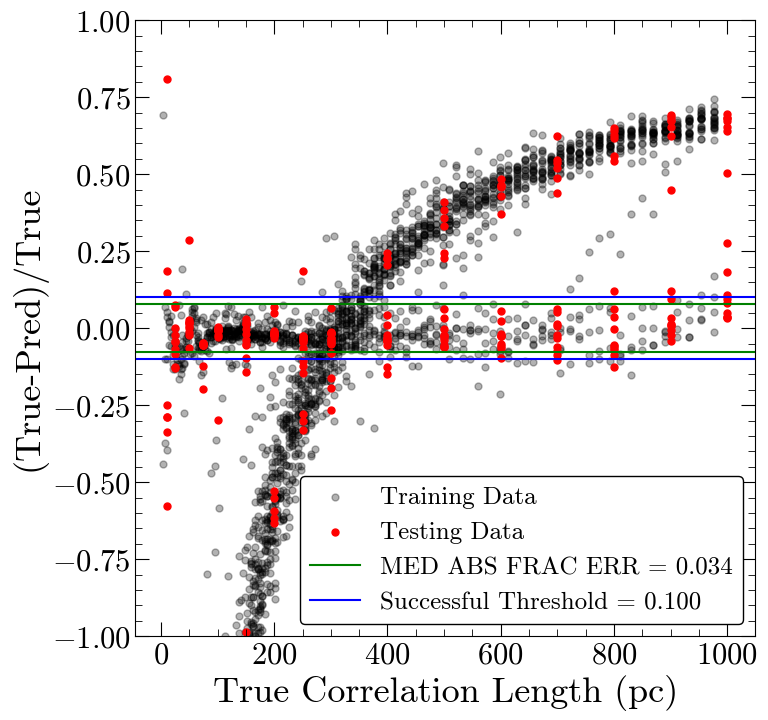

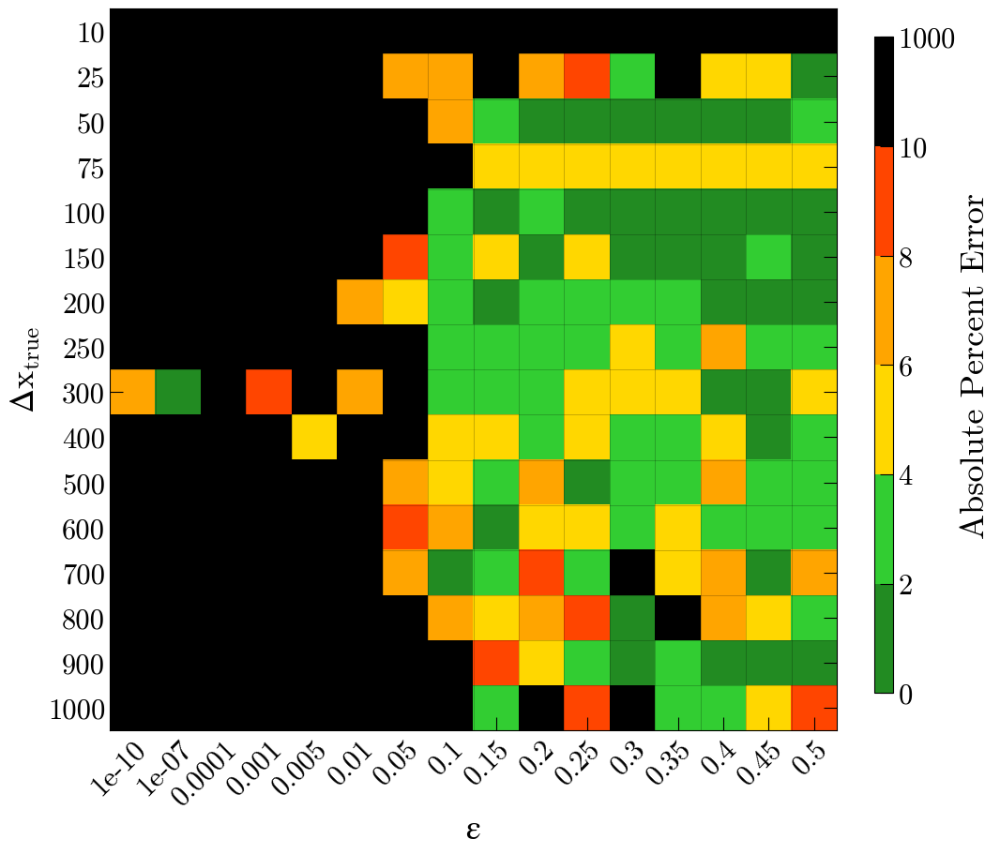

Number of squares with abs percent err>10%,  118


In [49]:
#model with even more layers, run for even more epochs, increase batch size even more
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=300)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

# Save best model

In [50]:
#reset the indices
indices=np.arange(0,len(all_model_stats))
all_model_stats.set_index(indices,inplace=True)
#round all values
all_model_stats=all_model_stats.round(2)

print('Min MAE Training')
print(all_model_stats['mae_training'].idxmin(),', min val=',min(all_model_stats['mae_training']))
print('')

print('Max Frac Success Training')
print(all_model_stats['frac_success_training'].idxmax(),', max val=',max(all_model_stats['frac_success_training']))
print('')

print('Min MAE Testing')
print(all_model_stats['mae_testing'].idxmin(),', min val=',min(all_model_stats['mae_testing']))
print('')

print('Max Frac Success Testing')
print(all_model_stats['frac_success_testing'].idxmax(),', max val=',max(all_model_stats['frac_success_testing']))
print('')

display(all_model_stats)

#best model options are 7 or 8


Min MAE Training
6 , min val= 139.35

Max Frac Success Training
7 , max val= 0.26

Min MAE Testing
7 , min val= 20.02

Max Frac Success Testing
8 , max val= 0.57



,mae_training,frac_success_training,mae_testing,frac_success_testing
0,158.07,0.22,42.90,0.48
1,155.76,0.22,38.59,0.41
2,143.98,0.20,34.74,0.40
3,147.80,0.21,32.77,0.48
4,144.47,0.21,31.96,0.41
5,155.77,0.20,44.64,0.41
6,139.35,0.16,33.87,0.33
7,154.02,0.26,20.02,0.54
8,144.59,0.26,23.29,0.57
9,156.09,0.23,34.46,0.48


In [52]:
#choose model 8 which is the best option across all runs

failed_fit_region_count=500

while failed_fit_region_count>109:
    #model with even more layers, run for even more epochs
    final_model = Sequential([
        Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
        MaxPooling1D(2), 
        Conv1D(64, 3, activation='relu'),
        MaxPooling1D(2), 
        Conv1D(128, 3, activation='relu'), 
        MaxPooling1D(2), 
        Flatten(), 
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1) 
    ])

    final_model.compile(optimizer='adam', loss='mse')

    final_model.fit(x_train, y_train, epochs=400, batch_size=32)

    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(final_model,stats=False,plot=False)
    
    print('')
    print(failed_fit_region_count)
    print('')

Epoch 1/400
92/92 [==============================] - 1s 5ms/step - loss: 96662.1719
Epoch 2/400
92/92 [==============================] - 1s 5ms/step - loss: 59980.3906
Epoch 3/400
92/92 [==============================] - 0s 5ms/step - loss: 59004.0352
Epoch 4/400
92/92 [==============================] - 0s 5ms/step - loss: 57789.7656
Epoch 5/400
92/92 [==============================] - 1s 6ms/step - loss: 57777.8398
Epoch 6/400
92/92 [==============================] - 0s 5ms/step - loss: 56780.5117
Epoch 7/400
92/92 [==============================] - 0s 5ms/step - loss: 56814.3789
Epoch 8/400
92/92 [==============================] - 1s 7ms/step - loss: 56581.5391
Epoch 9/400
92/92 [==============================] - 1s 6ms/step - loss: 56534.5742
Epoch 10/400
92/92 [==============================] - 1s 8ms/step - loss: 57326.6133
Epoch 11/400
92/92 [==============================] - 1s 7ms/step - loss: 56135.5039
Epoch 12/400
92/92 [==============================] - 1s 8ms/step - loss: 

92/92 [==============================] - 2s 19ms/step - loss: 52763.0703
Epoch 192/400
92/92 [==============================] - 1s 16ms/step - loss: 53087.3984
Epoch 193/400
92/92 [==============================] - 1s 14ms/step - loss: 53316.0469
Epoch 194/400
92/92 [==============================] - 2s 16ms/step - loss: 52857.3672
Epoch 195/400
92/92 [==============================] - 1s 13ms/step - loss: 53040.1875
Epoch 196/400
92/92 [==============================] - 1s 14ms/step - loss: 53308.8281
Epoch 197/400
92/92 [==============================] - 1s 14ms/step - loss: 52950.6289
Epoch 198/400
92/92 [==============================] - 1s 14ms/step - loss: 53060.4766
Epoch 199/400
92/92 [==============================] - 1s 15ms/step - loss: 52817.3867
Epoch 200/400
92/92 [==============================] - 1s 12ms/step - loss: 53762.9922
Epoch 201/400
92/92 [==============================] - 1s 14ms/step - loss: 53267.9609
Epoch 202/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 15ms/step - loss: 52339.9492
Epoch 380/400
92/92 [==============================] - 1s 13ms/step - loss: 52703.4453
Epoch 381/400
92/92 [==============================] - 1s 14ms/step - loss: 52141.1289
Epoch 382/400
92/92 [==============================] - 1s 13ms/step - loss: 52181.9336
Epoch 383/400
92/92 [==============================] - 1s 13ms/step - loss: 52377.0664
Epoch 384/400
92/92 [==============================] - 1s 15ms/step - loss: 51935.2266
Epoch 385/400
92/92 [==============================] - 1s 15ms/step - loss: 52171.0430
Epoch 386/400
92/92 [==============================] - 1s 15ms/step - loss: 52292.5898
Epoch 387/400
92/92 [==============================] - 1s 14ms/step - loss: 52428.1836
Epoch 388/400
92/92 [==============================] - 1s 14ms/step - loss: 52471.4648
Epoch 389/400
92/92 [==============================] - 1s 15ms/step - loss: 52271.9180
Epoch 390/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 11ms/step - loss: 53340.2109
Epoch 169/400
92/92 [==============================] - 1s 11ms/step - loss: 53429.6523
Epoch 170/400
92/92 [==============================] - 1s 12ms/step - loss: 53427.3398
Epoch 171/400
92/92 [==============================] - 1s 10ms/step - loss: 53675.2227
Epoch 172/400
92/92 [==============================] - 1s 11ms/step - loss: 53430.0430
Epoch 173/400
92/92 [==============================] - 1s 11ms/step - loss: 53677.1523
Epoch 174/400
92/92 [==============================] - 1s 12ms/step - loss: 53633.3594
Epoch 175/400
92/92 [==============================] - 1s 12ms/step - loss: 53610.1953
Epoch 176/400
92/92 [==============================] - 1s 11ms/step - loss: 53009.3906
Epoch 177/400
92/92 [==============================] - 1s 11ms/step - loss: 54294.6836
Epoch 178/400
92/92 [==============================] - 1s 10ms/step - loss: 53173.6367
Epoch 179/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 8ms/step - loss: 52378.4805
Epoch 357/400
92/92 [==============================] - 1s 8ms/step - loss: 52200.9844
Epoch 358/400
92/92 [==============================] - 1s 7ms/step - loss: 52515.7812
Epoch 359/400
92/92 [==============================] - 1s 8ms/step - loss: 52336.3398
Epoch 360/400
92/92 [==============================] - 1s 9ms/step - loss: 52612.9883
Epoch 361/400
92/92 [==============================] - 1s 10ms/step - loss: 52628.1094
Epoch 362/400
92/92 [==============================] - 1s 9ms/step - loss: 52461.4141
Epoch 363/400
92/92 [==============================] - 1s 10ms/step - loss: 52388.0977
Epoch 364/400
92/92 [==============================] - 1s 9ms/step - loss: 52646.1016
Epoch 365/400
92/92 [==============================] - 1s 7ms/step - loss: 52262.4570
Epoch 366/400
92/92 [==============================] - 1s 7ms/step - loss: 52339.9883
Epoch 367/400
92/92 [==============================] - 1s 7ms/step

In [53]:
#save the model
nb='03'
final_model.save('csv/nb05_sample_size_10207/'+nb+'_final_model')

INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/03_final_model/assets


INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/03_final_model/assets


In [56]:
def final_plot(nb,title,statx=10,staty=700,statdy=50,lim='default', siegel=True,success_fit_threshold=0.1):
    
    loaded_model = load_model('csv/nb05_sample_size_10207/'+nb+'_final_model')
    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(loaded_model,stats=False,plot=False)
    
    # use the model to predict the training data
    y_pred_train = loaded_model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the training data
    y_pred_test = loaded_model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,False)
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,False,True,success_fit_threshold)
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,False)
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold)
    
    #plot the agreement with stats
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(8,16),sharex=True)
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_ylabel(r'Predicted Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    
    # plot the fractional error between the datasets zoomed in
    ax2.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax2.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax2.axhline(0,color='black')
    ax2.axhline(med_frac_testing,color='green',label='Median Absolute\nFractional Error = {:.3f}'.format(med_frac_testing_success))
    ax2.axhline(-med_frac_testing,color='green')
    ax2.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.1f}'.format(success_fit_threshold))
    ax2.axhline(-success_fit_threshold,color='blue')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'($\lambda_{True}-\lambda_{Pred})/\lambda_{True}$')
    ax2.set_ylim((-1,1))
    ax2.legend()
    
    ax1.set_title(title)
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    plt.show()
    
    #make and save the heatmap, which is the figure that will be included in the paper
    failed_fit_region_count=heatmap_testing_data(testing_data,title,savefig=True,figname=nb+'_cnn_heatmap')
    

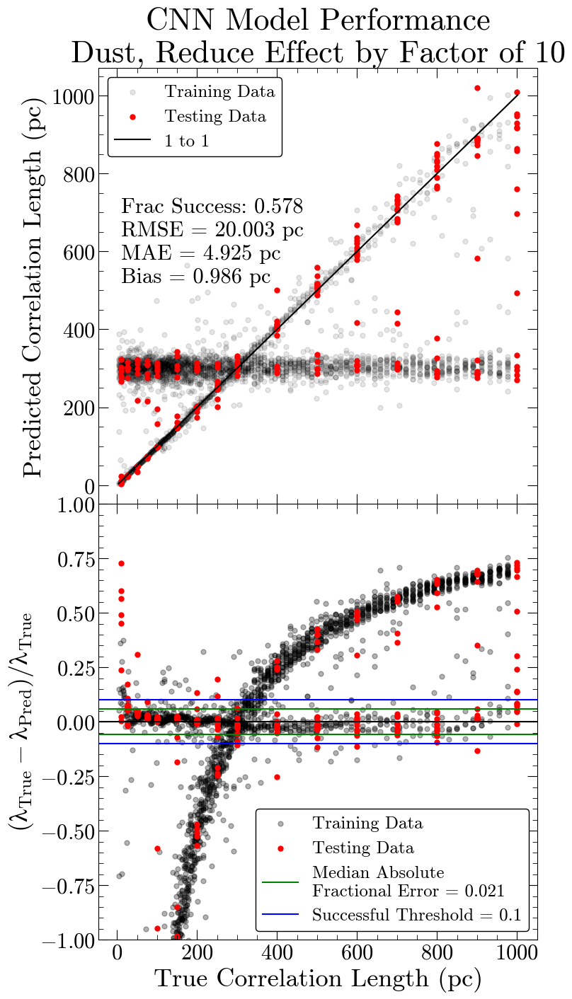

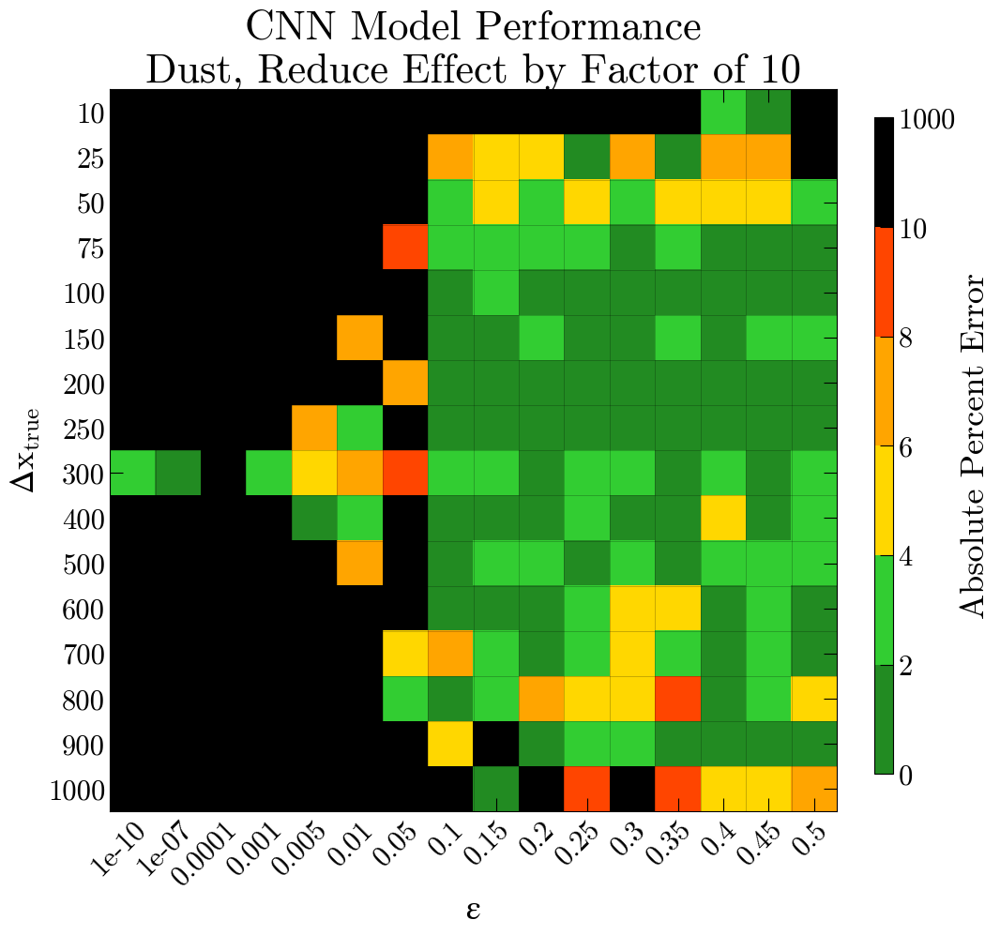

Number of squares with abs percent err>10%,  108


In [57]:
final_plot('03','CNN Model Performance\nDust, Reduce Effect by Factor of 10',statdy=60)